#Importing libraries

In [40]:
import torchvision
import torch
import numpy as np
from sklearn.cluster import KMeans
from PIL import Image
from matplotlib import pyplot as plt
from torchvision import transforms
import torch.optim as optim

In [41]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

# Original image

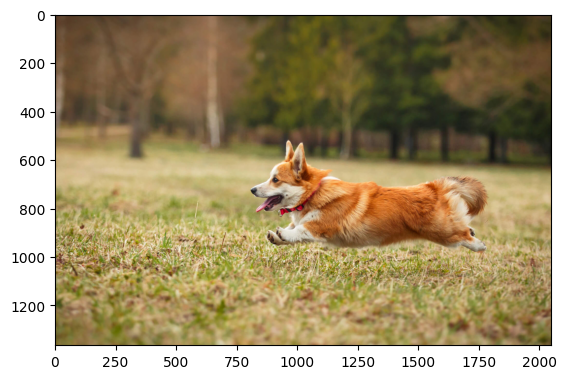

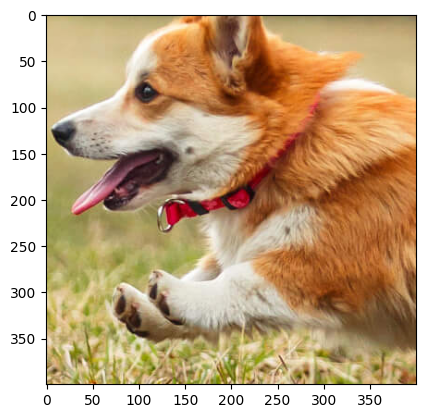

In [42]:
img = Image.open('dog.jpg').convert('RGB')
img_array_og = np.array(img)
plt.imshow(img_array_og)
plt.show()
img = img.crop((800, 600, 1200, 1000))

img.size

img_array_og = np.array(img)
plt.imshow(img_array_og)

In [43]:
img_array_og.shape

(400, 400, 3)

# Structured 30X30 patch added(Single colour)

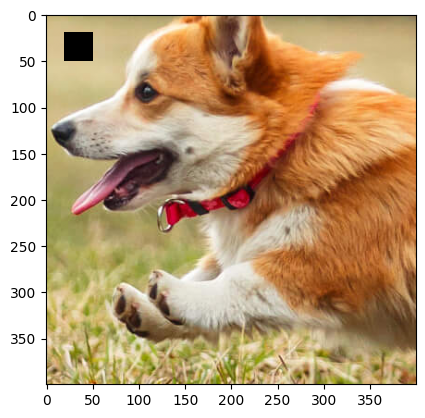

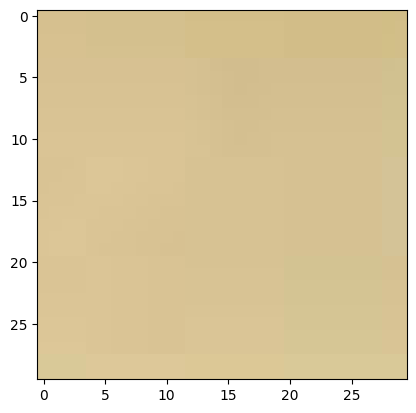

In [44]:
img_array = img_array_og.copy()
img_array = img_array.astype(float)
img_array[20:50, 20:50,:] = np.nan
plt.imshow(img_array/255)
plt.show()
plt.imshow(img_array_og[20:50, 20:50,:])
plt.show()


## Metrics3 Struct patch

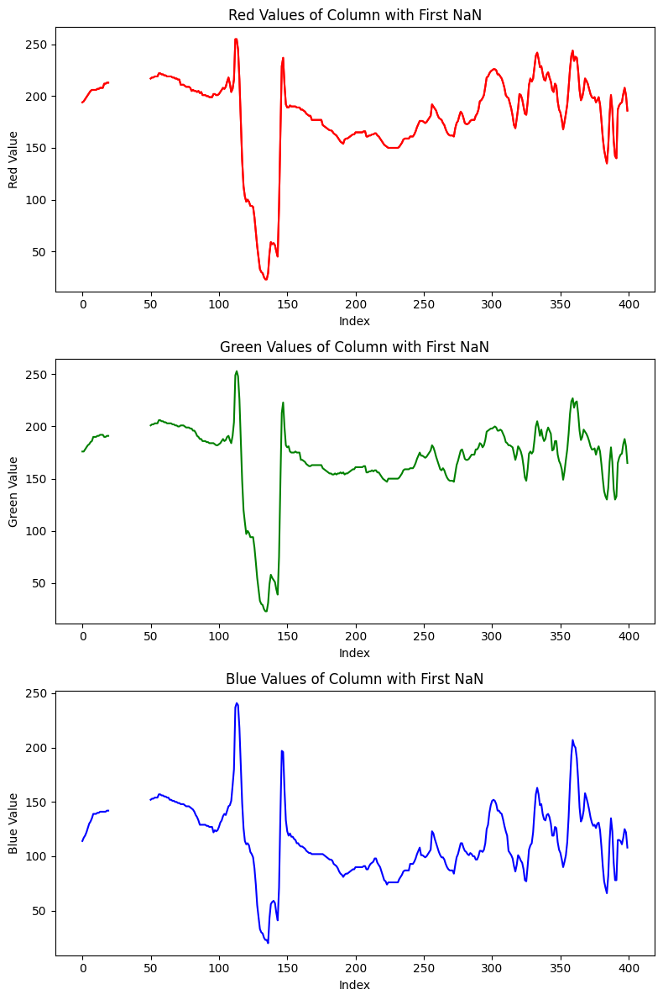

<Figure size 640x480 with 0 Axes>

In [45]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = torch.where(torch.isnan(torch.tensor(img_array)))[1][0]

# Get the red values of the column
red_values = torch.tensor(img_array[:, column_index, 0])
# Get the green values of the column
green_values = torch.tensor(img_array[:, column_index, 1])
# Get the blue values of the column
blue_values = torch.tensor(img_array[:, column_index, 2])

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')
# Plot the red values with missing values as black
axs[0].plot(red_values, color='red')
axs[0].scatter(torch.where(torch.isnan(red_values))[0], red_values[torch.isnan(red_values)], color='black')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values with missing values as black
axs[1].plot(green_values, color='green')
axs[1].scatter(torch.where(torch.isnan(green_values))[0], green_values[torch.isnan(green_values)], color='black')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values with missing values as black
axs[2].plot(blue_values, color='blue')
axs[2].scatter(torch.where(torch.isnan(blue_values))[0], blue_values[torch.isnan(blue_values)], color='black')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Reconstruction code with regularization and trained on masked values


In [46]:
import torch
import torch.optim as optim
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
def factorize(A, k, device=torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    A = A.to(device)
    # Randomly initialize A and B
    torch.manual_seed(42)
    W = torch.randn(A.shape[0], k, dtype=torch.float32, requires_grad=True, device=device)
    torch.manual_seed(42)
    H = torch.randn(k, A.shape[1],dtype=torch.float32, requires_grad=True, device=device)
    # Optimizer
    mask = ~torch.isnan(A)
    A_est = torch.matmul(W,H)
    error = torch.norm(A[mask] - A_est[mask])
    regularization = 0.12*(torch.norm(W) + torch.norm(H))
    loss = error + regularization
    optimizer = optim.Adam([W, H], lr=0.02)

    prev_loss = float('inf')
    max_iterations = 4000
    for i in range(max_iterations):

        optimizer.zero_grad()
        A_est = torch.matmul(W, H)
        error = torch.norm(A[mask] - A_est[mask])
        regularization = 0.12 * (torch.norm(W) + torch.norm(H))
        loss =  error + regularization
        loss.backward()
        optimizer.step()
        error = torch.norm(A[mask] - A_est[mask])
        if i % 100 == 0:
            print(f"Iteration {i}, Loss: {loss.item()}")

            # Check for convergence
            if abs(prev_loss - loss.item()) < 10^-6:
                print("Converged!")
                break

            prev_loss = loss.item()

    return W, H, loss


In [47]:
import tensorflow as tf
print(img_array)
res = np.isnan(img_array).sum()

# Printing the result
print('Result: ', res)


[[[196. 177. 121.]
  [196. 177. 121.]
  [196. 177. 121.]
  ...
  [143. 120.  86.]
  [143. 120.  86.]
  [143. 120.  86.]]

 [[197. 178. 122.]
  [197. 178. 122.]
  [197. 178. 122.]
  ...
  [143. 120.  86.]
  [143. 120.  86.]
  [143. 120.  86.]]

 [[198. 179. 123.]
  [198. 179. 123.]
  [198. 179. 123.]
  ...
  [142. 122.  87.]
  [142. 122.  87.]
  [142. 122.  87.]]

 ...

 [[158. 132.  83.]
  [162. 136.  87.]
  [162. 134.  84.]
  ...
  [164. 113.  48.]
  [165. 111.  51.]
  [167. 110.  55.]]

 [[157. 136.  79.]
  [171. 151.  92.]
  [184. 162. 102.]
  ...
  [174. 128.  66.]
  [180. 131.  75.]
  [184. 132.  82.]]

 [[162. 144.  82.]
  [176. 158.  94.]
  [186. 167. 101.]
  ...
  [182. 141.  79.]
  [191. 145.  93.]
  [197. 149. 103.]]]
Result:  2700


In [48]:
print(img_array.shape[0])
print(img_array)
img_array = torch.from_numpy(img_array.astype(np.float32))
K = torch.zeros((400, 400, 3), dtype=torch.float32)
for i in range(img_array.shape[0]):
  K[i] = img_array[i]
print(K)

400
[[[196. 177. 121.]
  [196. 177. 121.]
  [196. 177. 121.]
  ...
  [143. 120.  86.]
  [143. 120.  86.]
  [143. 120.  86.]]

 [[197. 178. 122.]
  [197. 178. 122.]
  [197. 178. 122.]
  ...
  [143. 120.  86.]
  [143. 120.  86.]
  [143. 120.  86.]]

 [[198. 179. 123.]
  [198. 179. 123.]
  [198. 179. 123.]
  ...
  [142. 122.  87.]
  [142. 122.  87.]
  [142. 122.  87.]]

 ...

 [[158. 132.  83.]
  [162. 136.  87.]
  [162. 134.  84.]
  ...
  [164. 113.  48.]
  [165. 111.  51.]
  [167. 110.  55.]]

 [[157. 136.  79.]
  [171. 151.  92.]
  [184. 162. 102.]
  ...
  [174. 128.  66.]
  [180. 131.  75.]
  [184. 132.  82.]]

 [[162. 144.  82.]
  [176. 158.  94.]
  [186. 167. 101.]
  ...
  [182. 141.  79.]
  [191. 145.  93.]
  [197. 149. 103.]]]
tensor([[[196., 177., 121.],
         [196., 177., 121.],
         [196., 177., 121.],
         ...,
         [143., 120.,  86.],
         [143., 120.,  86.],
         [143., 120.,  86.]],

        [[197., 178., 122.],
         [197., 178., 122.],
         [

## 30X30 reconstructed

Iteration 0, Loss: 4925.10693359375
Iteration 100, Loss: 67.94488525390625
Iteration 200, Loss: 55.147705078125
Iteration 300, Loss: 51.54234313964844
Iteration 400, Loss: 48.931488037109375
Iteration 500, Loss: 46.606624603271484
Iteration 600, Loss: 44.402496337890625
Iteration 700, Loss: 42.219871520996094
Iteration 800, Loss: 40.109344482421875
Iteration 900, Loss: 38.02556228637695
Iteration 1000, Loss: 35.95014190673828
Iteration 1100, Loss: 33.95562744140625
Iteration 1200, Loss: 32.00297927856445
Iteration 1300, Loss: 30.119579315185547
Iteration 1400, Loss: 28.223846435546875
Iteration 1500, Loss: 26.30177879333496
Iteration 1600, Loss: 24.361303329467773
Iteration 1700, Loss: 22.419307708740234
Iteration 1800, Loss: 20.498071670532227
Iteration 1900, Loss: 18.627761840820312
Iteration 2000, Loss: 16.848777770996094
Iteration 2100, Loss: 15.212173461914062
Iteration 2200, Loss: 13.772648811340332
Iteration 2300, Loss: 12.567564010620117
Iteration 2400, Loss: 11.604532241821289

torch.Size([400, 400, 3])
tensor([[[0.7686, 0.6941, 0.4745],
         [0.7686, 0.6941, 0.4745],
         [0.7686, 0.6941, 0.4745],
         ...,
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373]],

        [[0.7725, 0.6980, 0.4784],
         [0.7725, 0.6980, 0.4784],
         [0.7725, 0.6980, 0.4784],
         ...,
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373]],

        [[0.7765, 0.7020, 0.4824],
         [0.7765, 0.7020, 0.4824],
         [0.7765, 0.7020, 0.4824],
         ...,
         [0.5569, 0.4784, 0.3412],
         [0.5569, 0.4784, 0.3412],
         [0.5569, 0.4784, 0.3412]],

        ...,

        [[0.6196, 0.5176, 0.3255],
         [0.6353, 0.5333, 0.3412],
         [0.6353, 0.5255, 0.3294],
         ...,
         [0.6431, 0.4431, 0.1882],
         [0.6471, 0.4353, 0.2000],
         [0.6549, 0.4314, 0.2157]],

        [[0.6157, 0.5333, 0.3098],
         [0.6706, 0.5

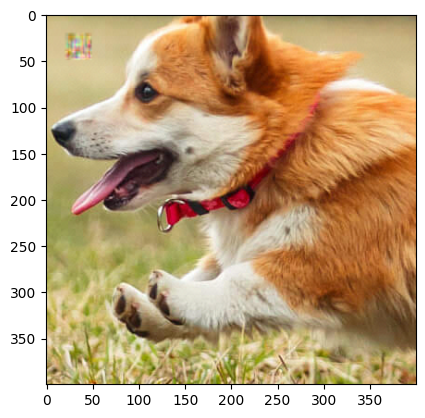

tensor(8.1151, device='cuda:0', grad_fn=<AddBackward0>)


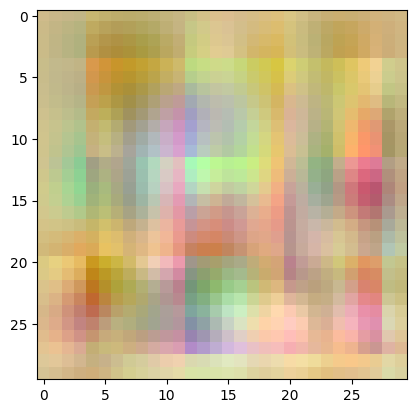

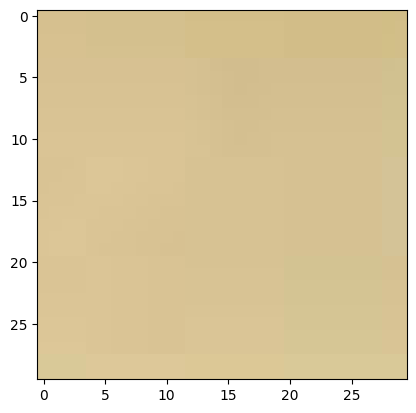

In [49]:
k=150
torch.manual_seed(42)
W = torch.randn(img_array.shape[0], k, 3, requires_grad=True, device=device)
torch.manual_seed(42)
H = torch.randn(k, img_array.shape[1], 3, requires_grad=True, device=device)
torch.manual_seed(42)
A = torch.randn(img_array.shape[0], img_array.shape[1], 3, requires_grad=True, device=device)
for i in range(3):
        W_n = W[:, :, i]
        H_n = H[:, :, i]
        A_n = (img_array[:, :, i].float())/255  # Convert to float for the factorize function
        W_n, H_n, loss = factorize(A_n, k, device=device)
        temp_result = torch.mm(W_n, H_n)

          # Detach the tensor before assigning it to A
        A[:, :, i].data.copy_(temp_result.detach())


print(A.shape)

print(img_array/255)
# res = A.isnan().sum()
# # Printing the result
# print('Result: ', res)

print(A)
# # Display the reconstructed image
reshaped_A = A.view(int(img_array.shape[0]), img_array.shape[1], img_array.shape[2])
reshaped_A_np_1 = reshaped_A.detach().cpu().numpy()
plt.imshow(reshaped_A_np_1)
plt.show()
print(loss)
patch_30x30x3 = reshaped_A_np_1[20:50, 20:50, :]
plt.imshow(patch_30x30x3)
plt.show()
plt.imshow(img_array_og[20:50, 20:50,:])
plt.show()


In [50]:
reshaped_A_np_1.shape

(400, 400, 3)

## Metrics 3 struct complete

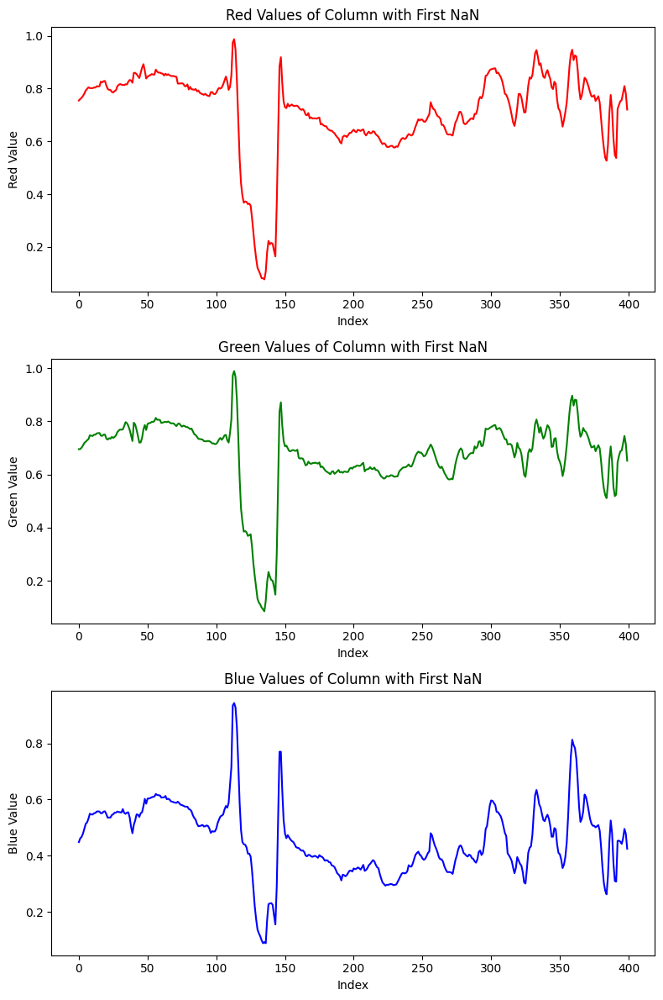

In [51]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = np.where(np.isnan(img_array))[1][0]

# Get the red values of the column
red_values = reshaped_A_np_1[:, column_index, 0]
# Get the green values of the column
green_values = reshaped_A_np_1[:, column_index, 1]
# Get the blue values of the column
blue_values = reshaped_A_np_1[:, column_index, 2]

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


In [52]:
img_array_og.shape


(400, 400, 3)

In [53]:
img_array_og_t = torch.tensor(img_array_og).to(device)

## Peak signal to noise ratio

In [54]:
reshaped_A.shape

torch.Size([400, 400, 3])

In [55]:
crop = img_array_og_t/255
X_pred = reshaped_A
rmse1 = torch.sqrt(torch.mean(torch.mean(((crop - X_pred)**2), dim=(1,2))))
print(rmse1.item())

0.010408967733383179


In [56]:
psnr1 =20 * np.log10(1.0/rmse1.item())
print("PSNR1:", psnr1)

PSNR1: 39.65184675450463


# Without regularization on entire A and Aest

## Reconstruction code without regularization trained on whole image with loss component only of the masked values

In [57]:

def factorize(A, k, device=torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    A = A.to(device)
    # Randomly initialize A and B
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    # Train the model
    for i in range(1000):
        # Compute the loss
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)

        # Zero the gradients
        optimizer.zero_grad()

        # Backpropagate
        loss.backward()

        # Update the parameters
        optimizer.step()

    return W, H, loss

## 30X30 reconstructed

<ipython-input-58-9bef6a9023d0>:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  A_n = torch.tensor(img_array[:, :, i], dtype=torch.float) / 255  # Convert to float for the factorize function


torch.Size([400, 400, 3])
tensor([[[0.7686, 0.6941, 0.4745],
         [0.7686, 0.6941, 0.4745],
         [0.7686, 0.6941, 0.4745],
         ...,
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373]],

        [[0.7725, 0.6980, 0.4784],
         [0.7725, 0.6980, 0.4784],
         [0.7725, 0.6980, 0.4784],
         ...,
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373]],

        [[0.7765, 0.7020, 0.4824],
         [0.7765, 0.7020, 0.4824],
         [0.7765, 0.7020, 0.4824],
         ...,
         [0.5569, 0.4784, 0.3412],
         [0.5569, 0.4784, 0.3412],
         [0.5569, 0.4784, 0.3412]],

        ...,

        [[0.6196, 0.5176, 0.3255],
         [0.6353, 0.5333, 0.3412],
         [0.6353, 0.5255, 0.3294],
         ...,
         [0.6431, 0.4431, 0.1882],
         [0.6471, 0.4353, 0.2000],
         [0.6549, 0.4314, 0.2157]],

        [[0.6157, 0.5333, 0.3098],
         [0.6706, 0.5

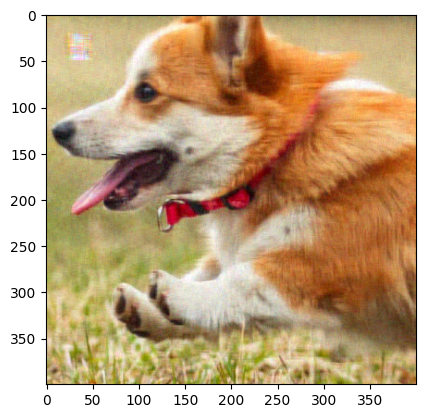

tensor(13.4744, device='cuda:0', grad_fn=<LinalgVectorNormBackward0>)


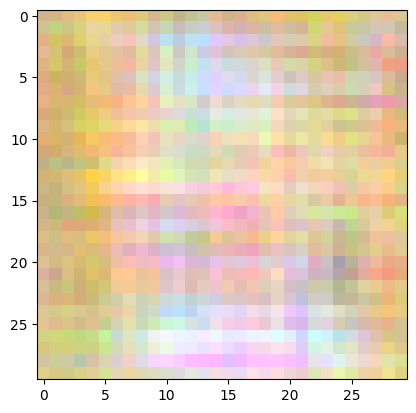

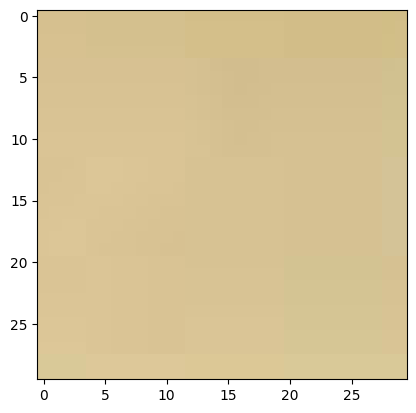

In [58]:
k=150
torch.manual_seed(42)
W = torch.randn(img_array.shape[0], k, 3, requires_grad=True, device=device)
torch.manual_seed(42)
H = torch.randn(k, img_array.shape[1], 3, requires_grad=True, device=device)
torch.manual_seed(42)
A = torch.randn(img_array.shape[0], img_array.shape[1], 3, requires_grad=True, device=device)
for i in range(3):
        W_n = W[:, :, i]
        H_n = H[:, :, i]
        A_n = torch.tensor(img_array[:, :, i], dtype=torch.float) / 255  # Convert to float for the factorize function
        W_n, H_n, loss = factorize(A_n, k, device=device)
        temp_result = torch.mm(W_n, H_n)

          # Detach the tensor before assigning it to A
        A[:, :, i].data.copy_(temp_result.detach())


print(A.shape)

print(img_array/255)
# res = A.isnan().sum()
# # Printing the result
# print('Result: ', res)

print(A)
# # Display the reconstructed image
reshaped_A = A.view(int(img_array.shape[0]), img_array.shape[1], img_array.shape[2])
reshaped_A_np_1 = reshaped_A.detach().cpu().numpy()
plt.imshow(reshaped_A_np_1)
plt.show()
print(loss)
patch_30x30x3 = reshaped_A_np_1[20:50, 20:50, :]
plt.imshow(patch_30x30x3)
plt.show()
plt.imshow(img_array_og[20:50, 20:50,:])
plt.show()


## Metrics3 struct complete without reg.

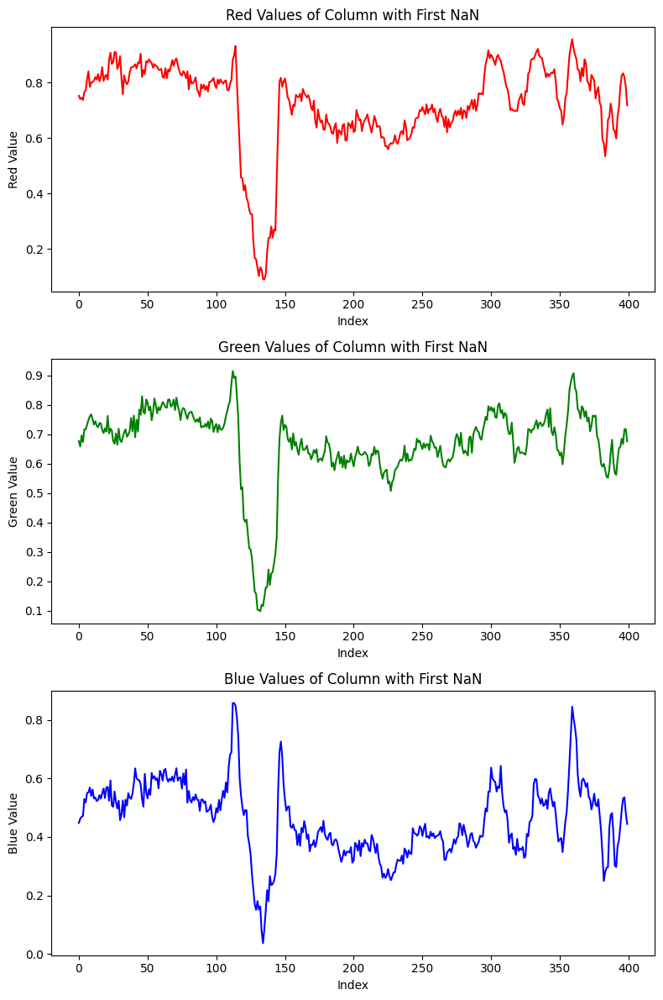

In [59]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = np.where(np.isnan(img_array))[1][0]

# Get the red values of the column
red_values = reshaped_A_np_1[:, column_index, 0]
# Get the green values of the column
green_values = reshaped_A_np_1[:, column_index, 1]
# Get the blue values of the column
blue_values = reshaped_A_np_1[:, column_index, 2]

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


## Peak signal to noise ratio

In [60]:
crop = img_array_og_t/255
X_pred = reshaped_A
rmse2 = torch.sqrt(torch.mean(torch.mean(((crop - X_pred)**2), dim=(1,2))))
print(rmse2.item())

0.03506001830101013


In [61]:
psnr2 =20 * np.log10(1.0/rmse2.item())
print("PSNR2:", psnr2)

PSNR2: 29.103757230888043


# a random subset of 900 (30X30) pixels is missing from the image.

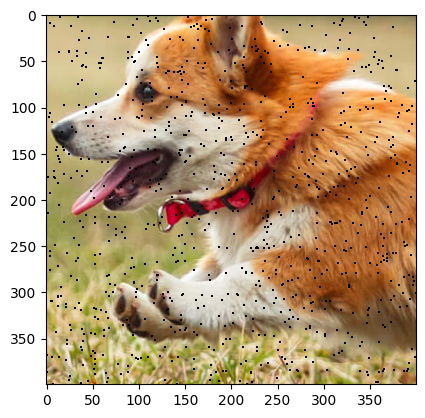

In [62]:
img_array_2 = img_array_og.copy().astype(float)
np.random.seed(42)
# Generate random indices for 900 points
random_indices = np.random.randint(0, img_array_2.shape[0], size=(900, 2))

# Set the selected points to NaN
img_array_2[random_indices[:, 0], random_indices[:, 1], :] = np.nan

# Display the modified image
plt.imshow(img_array_2 / 255)
plt.show()


## metrics3 unstruct missing

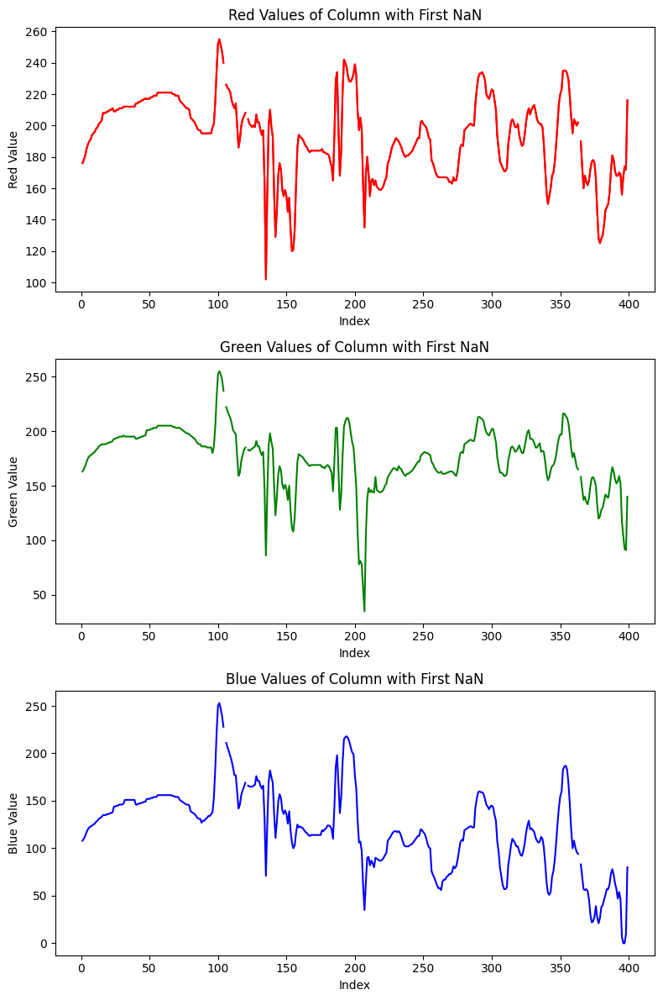

<Figure size 640x480 with 0 Axes>

In [63]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = torch.where(torch.isnan(torch.tensor(img_array_2)))[1][0]

# Get the red values of the column
red_values = torch.tensor(img_array_2[:, column_index, 0])
# Get the green values of the column
green_values = torch.tensor(img_array_2[:, column_index, 1])
# Get the blue values of the column
blue_values = torch.tensor(img_array_2[:, column_index, 2])

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')
# Plot the red values with missing values as black
axs[0].plot(red_values, color='red')
axs[0].scatter(torch.where(torch.isnan(red_values))[0], red_values[torch.isnan(red_values)], color='black')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values with missing values as black
axs[1].plot(green_values, color='green')
axs[1].scatter(torch.where(torch.isnan(green_values))[0], green_values[torch.isnan(green_values)], color='black')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values with missing values as black
axs[2].plot(blue_values, color='blue')
axs[2].scatter(torch.where(torch.isnan(blue_values))[0], blue_values[torch.isnan(blue_values)], color='black')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

## Reconstruction code


<ipython-input-64-b17828e862d9>:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  A_n = torch.tensor(img_array[:, :, i], dtype=torch.float) / 255  # Convert to float for the factorize function


torch.Size([400, 400, 3])
tensor([[[0.7686, 0.6941, 0.4745],
         [0.7686, 0.6941, 0.4745],
         [0.7686, 0.6941, 0.4745],
         ...,
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373]],

        [[0.7725, 0.6980, 0.4784],
         [0.7725, 0.6980, 0.4784],
         [0.7725, 0.6980, 0.4784],
         ...,
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373]],

        [[0.7765, 0.7020, 0.4824],
         [0.7765, 0.7020, 0.4824],
         [0.7765, 0.7020, 0.4824],
         ...,
         [0.5569, 0.4784, 0.3412],
         [0.5569, 0.4784, 0.3412],
         [0.5569, 0.4784, 0.3412]],

        ...,

        [[0.6196, 0.5176, 0.3255],
         [0.6353, 0.5333, 0.3412],
         [0.6353, 0.5255, 0.3294],
         ...,
         [0.6431, 0.4431, 0.1882],
         [0.6471, 0.4353, 0.2000],
         [0.6549, 0.4314, 0.2157]],

        [[0.6157, 0.5333, 0.3098],
         [0.6706, 0.5

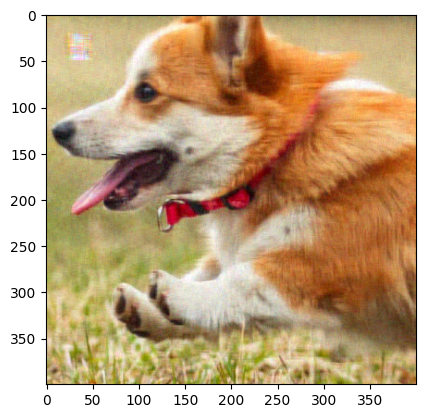

tensor(13.4744, device='cuda:0', grad_fn=<LinalgVectorNormBackward0>)


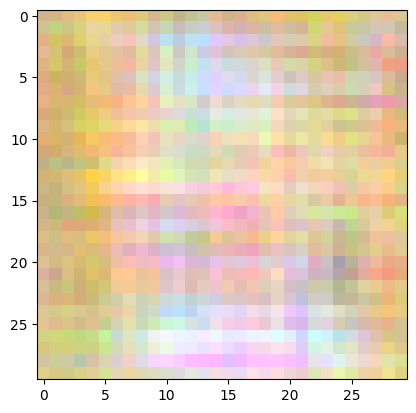

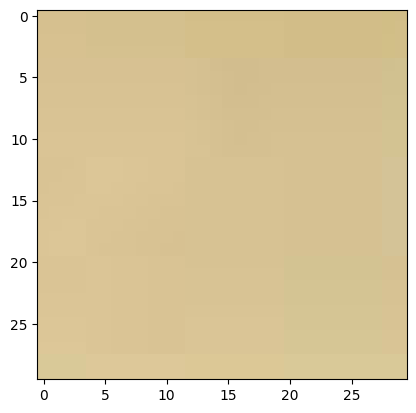

In [64]:
k=150
torch.manual_seed(42)
W = torch.randn(img_array.shape[0], k, 3, requires_grad=True, device=device)
torch.manual_seed(42)
H = torch.randn(k, img_array.shape[1], 3, requires_grad=True, device=device)
torch.manual_seed(42)
A = torch.randn(img_array.shape[0], img_array.shape[1], 3, requires_grad=True, device=device)
for i in range(3):
        W_n = W[:, :, i]
        H_n = H[:, :, i]
        A_n = torch.tensor(img_array[:, :, i], dtype=torch.float) / 255  # Convert to float for the factorize function
        W_n, H_n, loss = factorize(A_n, k, device=device)
        temp_result = torch.mm(W_n, H_n)

          # Detach the tensor before assigning it to A
        A[:, :, i].data.copy_(temp_result.detach())


print(A.shape)

print(img_array/255)
# res = A.isnan().sum()
# # Printing the result
# print('Result: ', res)

print(A)
# # Display the reconstructed image
reshaped_A = A.view(int(img_array.shape[0]), img_array.shape[1], img_array.shape[2])
reshaped_A_np_2 = reshaped_A.detach().cpu().numpy()
plt.imshow(reshaped_A_np_2)
plt.show()
print(loss)
patch_30x30x3 = reshaped_A_np_2[20:50, 20:50, :]
plt.imshow(patch_30x30x3)
plt.show()
plt.imshow(img_array_og[20:50, 20:50,:])
plt.show()


## Reconstructed metric unstruct

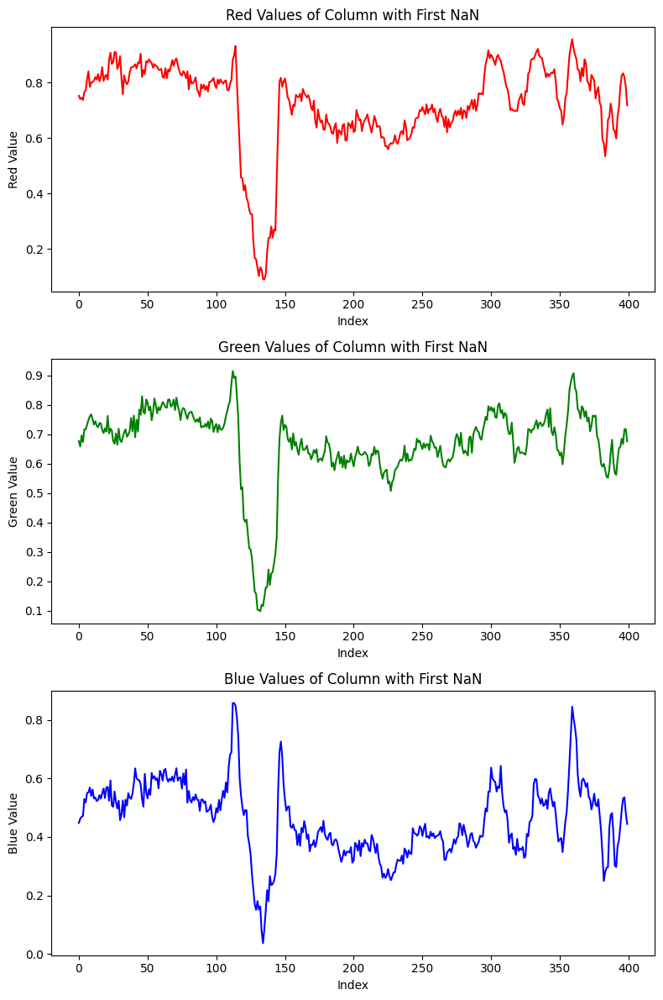

In [65]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = np.where(np.isnan(img_array))[1][0]

# Get the red values of the column
red_values = reshaped_A_np_2[:, column_index, 0]
# Get the green values of the column
green_values = reshaped_A_np_2[:, column_index, 1]
# Get the blue values of the column
blue_values = reshaped_A_np_2[:, column_index, 2]

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


## Peak signal to noise

In [66]:
crop = img_array_og_t/255
X_pred = reshaped_A
rmse3 = torch.sqrt(torch.mean(torch.mean(((crop - X_pred)**2), dim=(1,2))))
print(rmse3.item())

0.03506001830101013


In [67]:
psnr3 =20 * np.log10(1.0/rmse3.item())
print("PSNR3:", psnr3)

PSNR3: 29.103757230888043


# 20 X 20


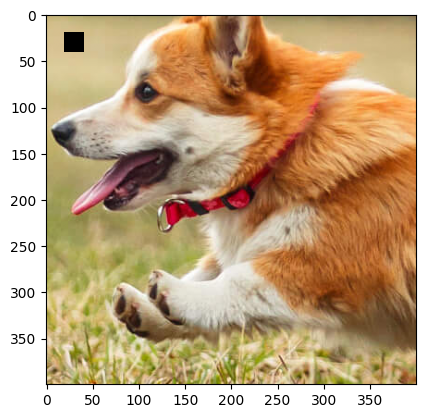

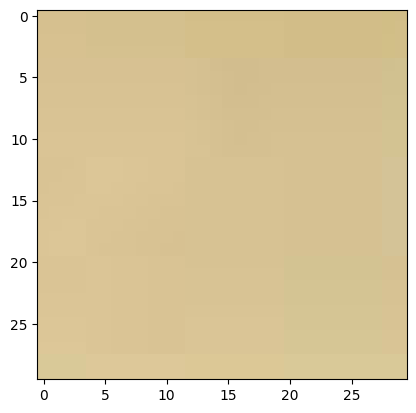

In [68]:
img_array_20 = img_array_og.copy()
img_array_20 = img_array_20.astype(float)
img_array_20[20:40, 20:40,:] = np.nan
plt.imshow(img_array_20/255)
plt.show()
plt.imshow(img_array_og[20:50, 20:50,:])
plt.show()


## Metric3 Struct patch 20X20

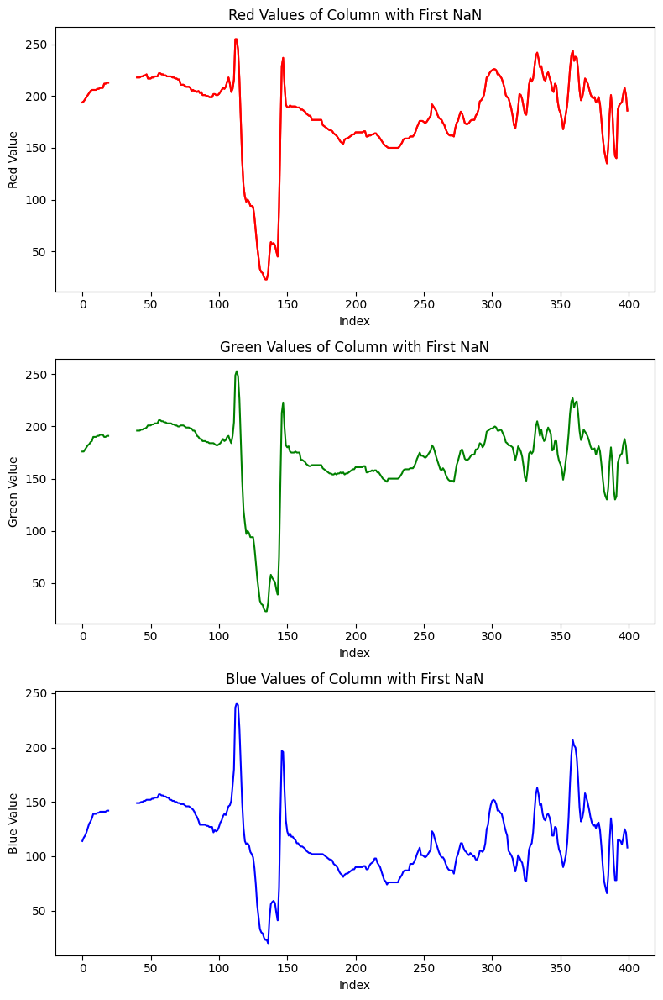

<Figure size 640x480 with 0 Axes>

In [69]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = torch.where(torch.isnan(torch.tensor(img_array_20)))[1][0]

# Get the red values of the column
red_values = torch.tensor(img_array_20[:, column_index, 0])
# Get the green values of the column
green_values = torch.tensor(img_array_20[:, column_index, 1])
# Get the blue values of the column
blue_values = torch.tensor(img_array_20[:, column_index, 2])

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')
# Plot the red values with missing values as black
axs[0].plot(red_values, color='red')
axs[0].scatter(torch.where(torch.isnan(red_values))[0], red_values[torch.isnan(red_values)], color='black')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values with missing values as black
axs[1].plot(green_values, color='green')
axs[1].scatter(torch.where(torch.isnan(green_values))[0], green_values[torch.isnan(green_values)], color='black')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values with missing values as black
axs[2].plot(blue_values, color='blue')
axs[2].scatter(torch.where(torch.isnan(blue_values))[0], blue_values[torch.isnan(blue_values)], color='black')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

## Reconstruction code


<ipython-input-70-778577d85358>:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  A_n = torch.tensor(img_array[:, :, i], dtype=torch.float) / 255  # Convert to float for the factorize function


torch.Size([400, 400, 3])
tensor([[[0.7686, 0.6941, 0.4745],
         [0.7686, 0.6941, 0.4745],
         [0.7686, 0.6941, 0.4745],
         ...,
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373]],

        [[0.7725, 0.6980, 0.4784],
         [0.7725, 0.6980, 0.4784],
         [0.7725, 0.6980, 0.4784],
         ...,
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373],
         [0.5608, 0.4706, 0.3373]],

        [[0.7765, 0.7020, 0.4824],
         [0.7765, 0.7020, 0.4824],
         [0.7765, 0.7020, 0.4824],
         ...,
         [0.5569, 0.4784, 0.3412],
         [0.5569, 0.4784, 0.3412],
         [0.5569, 0.4784, 0.3412]],

        ...,

        [[0.6196, 0.5176, 0.3255],
         [0.6353, 0.5333, 0.3412],
         [0.6353, 0.5255, 0.3294],
         ...,
         [0.6431, 0.4431, 0.1882],
         [0.6471, 0.4353, 0.2000],
         [0.6549, 0.4314, 0.2157]],

        [[0.6157, 0.5333, 0.3098],
         [0.6706, 0.5

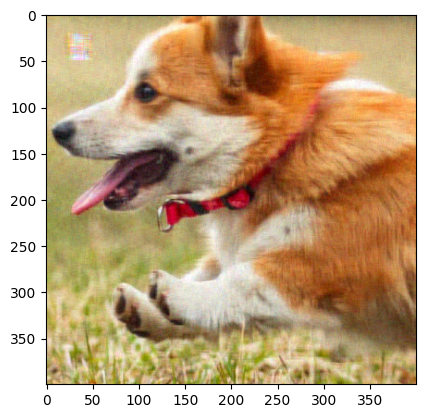

tensor(13.4744, device='cuda:0', grad_fn=<LinalgVectorNormBackward0>)


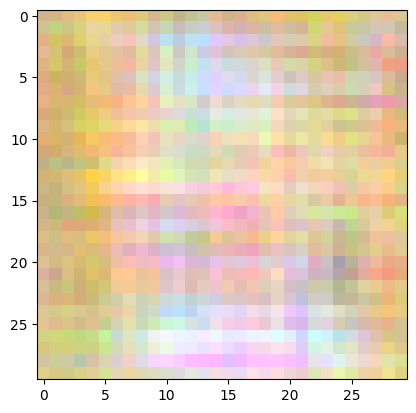

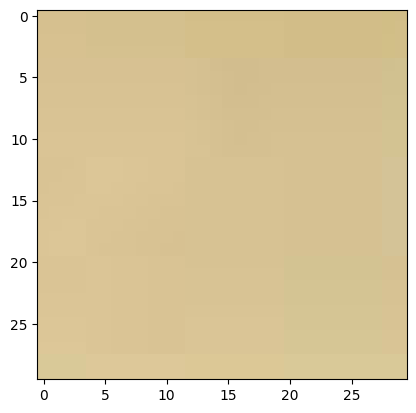

In [70]:
k=150
torch.manual_seed(42)
W = torch.randn(img_array.shape[0], k, 3, requires_grad=True, device=device)
torch.manual_seed(42)
H = torch.randn(k, img_array.shape[1], 3, requires_grad=True, device=device)
torch.manual_seed(42)
A = torch.randn(img_array.shape[0], img_array.shape[1], 3, requires_grad=True, device=device)
for i in range(3):
        W_n = W[:, :, i]
        H_n = H[:, :, i]
        A_n = torch.tensor(img_array[:, :, i], dtype=torch.float) / 255  # Convert to float for the factorize function
        W_n, H_n, loss = factorize(A_n, k, device=device)
        temp_result = torch.mm(W_n, H_n)

          # Detach the tensor before assigning it to A
        A[:, :, i].data.copy_(temp_result.detach())


print(A.shape)

print(img_array/255)
# res = A.isnan().sum()
# # Printing the result
# print('Result: ', res)

print(A)
# # Display the reconstructed image
reshaped_A = A.view(int(img_array.shape[0]), img_array.shape[1], img_array.shape[2])
reshaped_A_np_20 = reshaped_A.detach().cpu().numpy()
plt.imshow(reshaped_A_np_20)
plt.show()
print(loss)
patch_30x30x3 = reshaped_A_np_20[20:50, 20:50, :]
plt.imshow(patch_30x30x3)
plt.show()
plt.imshow(img_array_og[20:50, 20:50,:])
plt.show()


## Reconstructed Metric3 struct

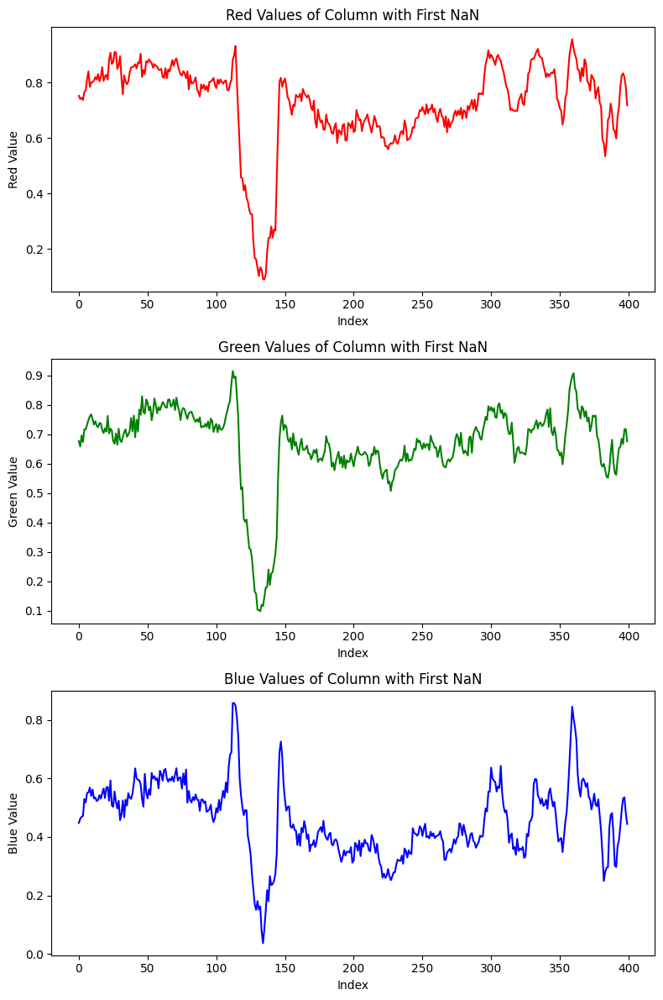

In [71]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = np.where(np.isnan(img_array_20))[1][0]

# Get the red values of the column
red_values = reshaped_A_np_20[:, column_index, 0]
# Get the green values of the column
green_values = reshaped_A_np_20[:, column_index, 1]
# Get the blue values of the column
blue_values = reshaped_A_np_20[:, column_index, 2]

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


## Peak signal to noise ratio


In [72]:
crop = img_array_og_t/255
X_pred = reshaped_A
rmse4 = torch.sqrt(torch.mean(torch.mean(((crop - X_pred)**2), dim=(1,2))))
print(rmse4.item())

0.03506001830101013


In [73]:
psnr4 =20 * np.log10(1.0/rmse4.item())
print("PSNR4:", psnr4)

PSNR4: 29.103757230888043


# a random subset of 400 (20X20) pixels is missing from the image.

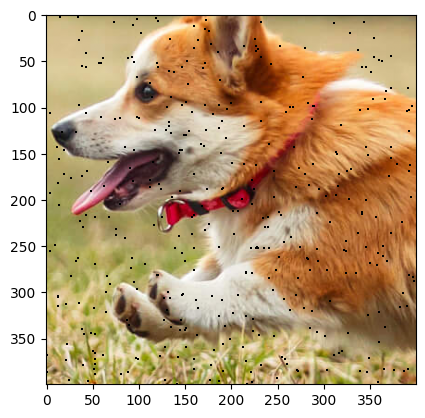

In [74]:
img_array_20_2 = img_array_og.copy().astype(float)
np.random.seed(42)
# Generate random indices for 400 points
random_indices = np.random.randint(0, img_array_20_2.shape[0], size=(400, 2))

# Set the selected points to NaN
img_array_20_2[random_indices[:, 0], random_indices[:, 1], :] = np.nan

# Display the modified image
plt.imshow(img_array_20_2 / 255)
plt.show()


## Metric3 unstruct patch 20X20

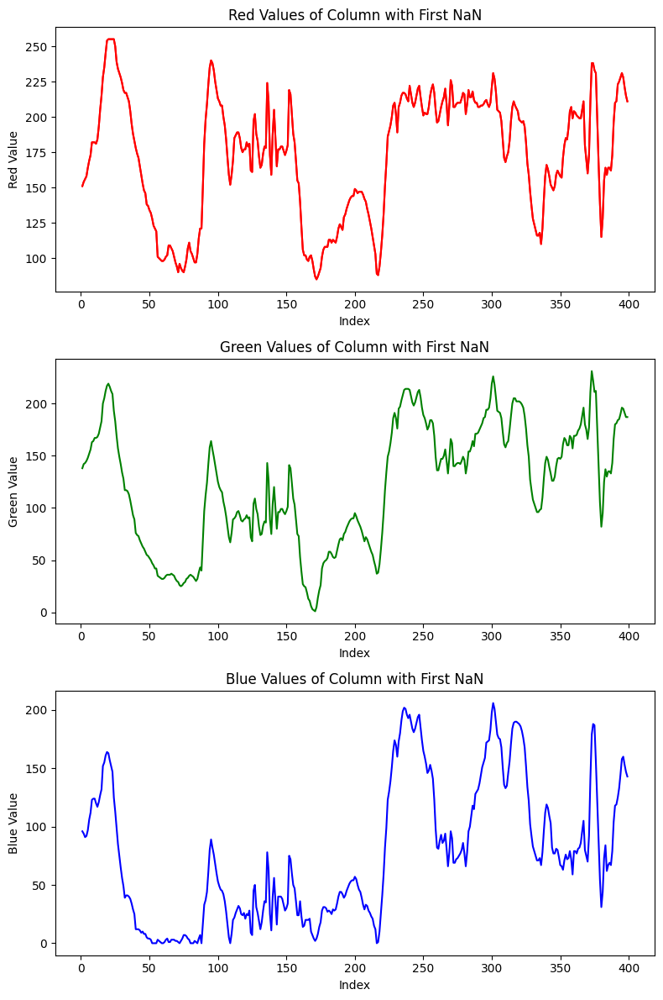

<Figure size 640x480 with 0 Axes>

In [75]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = torch.where(torch.isnan(torch.tensor(img_array_20_2)))[1][0]

# Get the red values of the column
red_values = torch.tensor(img_array_20_2[:, column_index, 0])
# Get the green values of the column
green_values = torch.tensor(img_array_20_2[:, column_index, 1])
# Get the blue values of the column
blue_values = torch.tensor(img_array_20_2[:, column_index, 2])

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')
# Plot the red values with missing values as black
axs[0].plot(red_values, color='red')
axs[0].scatter(torch.where(torch.isnan(red_values))[0], red_values[torch.isnan(red_values)], color='black')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values with missing values as black
axs[1].plot(green_values, color='green')
axs[1].scatter(torch.where(torch.isnan(green_values))[0], green_values[torch.isnan(green_values)], color='black')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values with missing values as black
axs[2].plot(blue_values, color='blue')
axs[2].scatter(torch.where(torch.isnan(blue_values))[0], blue_values[torch.isnan(blue_values)], color='black')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

torch.Size([400, 400, 3])
[[[0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  ...
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]]

 ...

 [[0.61960784 0.51764706 0.3254902 ]
  [0.63529412 0.53333333 0.34117647]
  [0.63529412 0.5254902  0.32941176]
  ...
  [0.64313725 0.44313725 0.18823529]
  [0.64705882 0.43529412 0.2       ]
  [0.65490196 0.43137255 0.21568627]]

 [[0.61568627 0.53333333 0.30980392]
  [0.670588

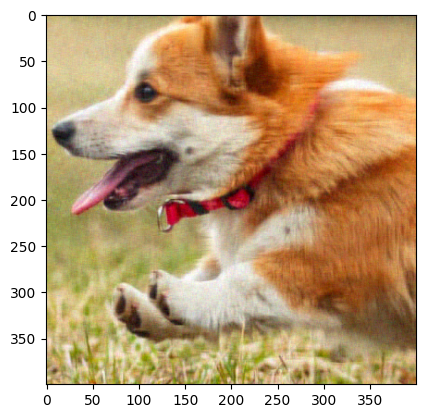

tensor(13.4795, device='cuda:0', grad_fn=<LinalgVectorNormBackward0>)


In [76]:
k=150
torch.manual_seed(42)
W = torch.randn(img_array_20_2.shape[0], k, 3, requires_grad=True, device=device)
torch.manual_seed(42)
H = torch.randn(k, img_array_20_2.shape[1], 3, requires_grad=True, device=device)
torch.manual_seed(42)
A = torch.randn(img_array_20_2.shape[0], img_array_20_2.shape[1], 3, requires_grad=True, device=device)
for i in range(3):
        W_n = W[:, :, i]
        H_n = H[:, :, i]
        A_n = (torch.from_numpy(img_array_20_2[:, :, i]).float())/255

        W_n, H_n, loss = factorize(A_n, k, device=device)
        temp_result = torch.mm(W_n, H_n)

          # Detach the tensor before assigning it to A
        A[:, :, i].data.copy_(temp_result.detach())


print(A.shape)

print(img_array_20_2/255)
# res = A.isnan().sum()
# # Printing the result
# print('Result: ', res)

print(A)
# # Display the reconstructed image
reshaped_A = A.view(int(img_array_20_2.shape[0]), img_array_20_2.shape[1], img_array_20_2.shape[2])
reshaped_A_np_20 = reshaped_A.detach().cpu().numpy()
plt.imshow(reshaped_A_np_20)
plt.show()

print(loss)

## Reconst unstruct metric3

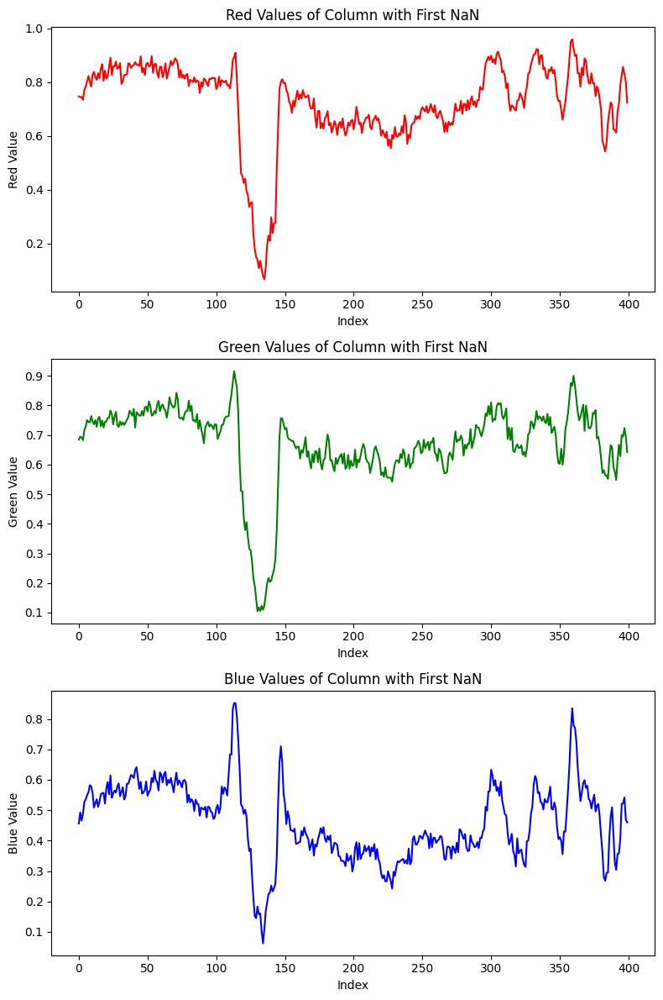

In [77]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = np.where(np.isnan(img_array_20))[1][0]

# Get the red values of the column
red_values = reshaped_A_np_20[:, column_index, 0]
# Get the green values of the column
green_values = reshaped_A_np_20[:, column_index, 1]
# Get the blue values of the column
blue_values = reshaped_A_np_20[:, column_index, 2]

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


## Peak signal to noise ratio

In [78]:
crop = img_array_og_t/255
X_pred = reshaped_A
rmse5 = torch.sqrt(torch.mean(torch.mean(((crop - X_pred)**2), dim=(1,2))))
print(rmse5.item())

0.03385575860738754


In [79]:
psnr5 =20 * np.log10(1.0/rmse5.item())
print("psnr5:", psnr5)

psnr5: 29.407349010061182


# 40X40


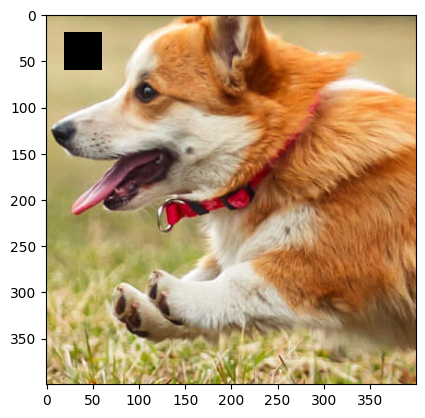

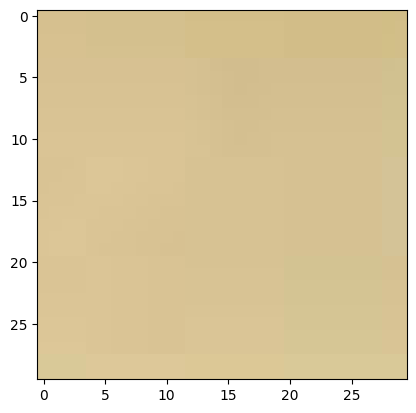

In [80]:
img_array_40 = img_array_og.copy()
img_array_40 = img_array_40.astype(float)
img_array_40[20:60, 20:60,:] = np.nan
plt.imshow(img_array_40/255)
plt.show()
plt.imshow(img_array_og[20:50, 20:50,:])
plt.show()


## Metric3 struct patch 40X40

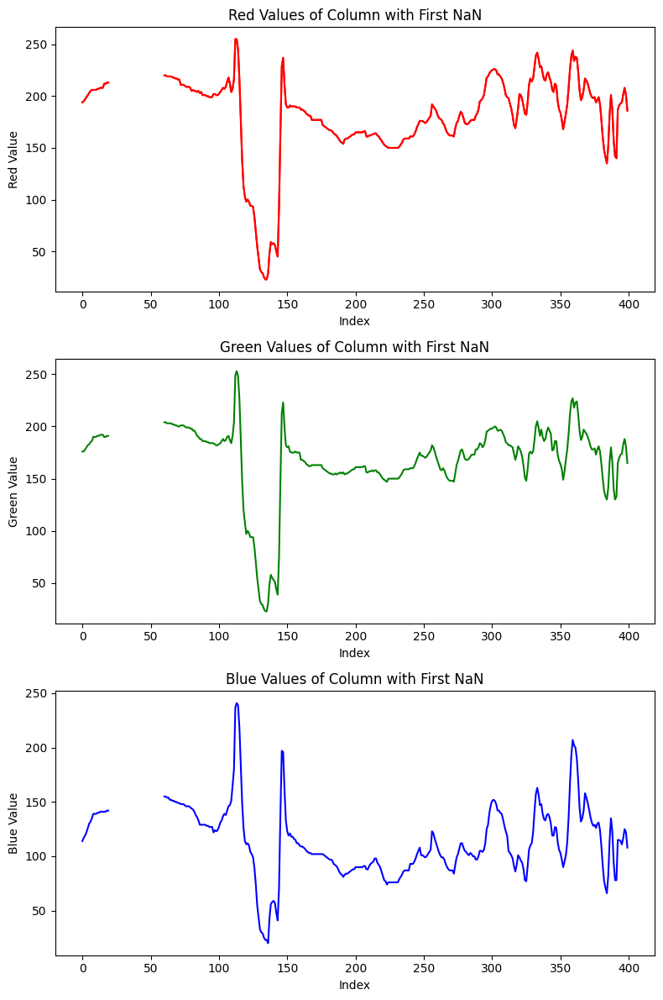

<Figure size 640x480 with 0 Axes>

In [81]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = torch.where(torch.isnan(torch.tensor(img_array_40)))[1][0]

# Get the red values of the column
red_values = torch.tensor(img_array_40[:, column_index, 0])
# Get the green values of the column
green_values = torch.tensor(img_array_40[:, column_index, 1])
# Get the blue values of the column
blue_values = torch.tensor(img_array_40[:, column_index, 2])

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')
# Plot the red values with missing values as black
axs[0].plot(red_values, color='red')
axs[0].scatter(torch.where(torch.isnan(red_values))[0], red_values[torch.isnan(red_values)], color='black')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values with missing values as black
axs[1].plot(green_values, color='green')
axs[1].scatter(torch.where(torch.isnan(green_values))[0], green_values[torch.isnan(green_values)], color='black')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values with missing values as black
axs[2].plot(blue_values, color='blue')
axs[2].scatter(torch.where(torch.isnan(blue_values))[0], blue_values[torch.isnan(blue_values)], color='black')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

## Reconst code

torch.Size([400, 400, 3])
[[[0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  ...
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]]

 ...

 [[0.61960784 0.51764706 0.3254902 ]
  [0.63529412 0.53333333 0.34117647]
  [0.63529412 0.5254902  0.32941176]
  ...
  [0.64313725 0.44313725 0.18823529]
  [0.64705882 0.43529412 0.2       ]
  [0.65490196 0.43137255 0.21568627]]

 [[0.61568627 0.53333333 0.30980392]
  [0.670588

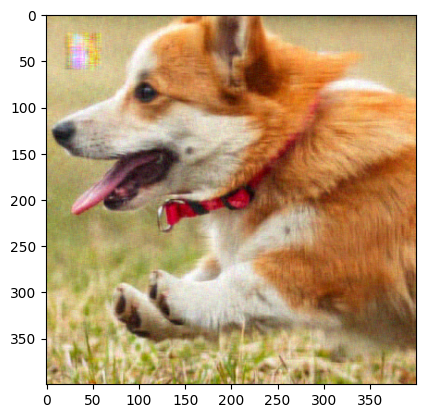

tensor(13.4620, device='cuda:0', grad_fn=<LinalgVectorNormBackward0>)


In [82]:
k=150
torch.manual_seed(42)
W = torch.randn(img_array_40.shape[0], k, 3, requires_grad=True, device=device)
torch.manual_seed(42)
H = torch.randn(k, img_array_40.shape[1], 3, requires_grad=True, device=device)
torch.manual_seed(42)
A = torch.randn(img_array_40.shape[0], img_array_40.shape[1], 3, requires_grad=True, device=device)
for i in range(3):
        W_n = W[:, :, i]
        H_n = H[:, :, i]
        A_n = (torch.from_numpy(img_array_40[:, :, i]).float())/255

        W_n, H_n, loss = factorize(A_n, k, device=device)
        temp_result = torch.mm(W_n, H_n)

          # Detach the tensor before assigning it to A
        A[:, :, i].data.copy_(temp_result.detach())


print(A.shape)

print(img_array_40/255)
# res = A.isnan().sum()
# # Printing the result
# print('Result: ', res)

print(A)
# # Display the reconstructed image
reshaped_A = A.view(int(img_array_40.shape[0]), img_array_40.shape[1], img_array_40.shape[2])
reshaped_A_np_40 = reshaped_A.detach().cpu().numpy()
plt.imshow(reshaped_A_np_40)
plt.show()

print(loss)

## Reconst metric3 struct 40x40

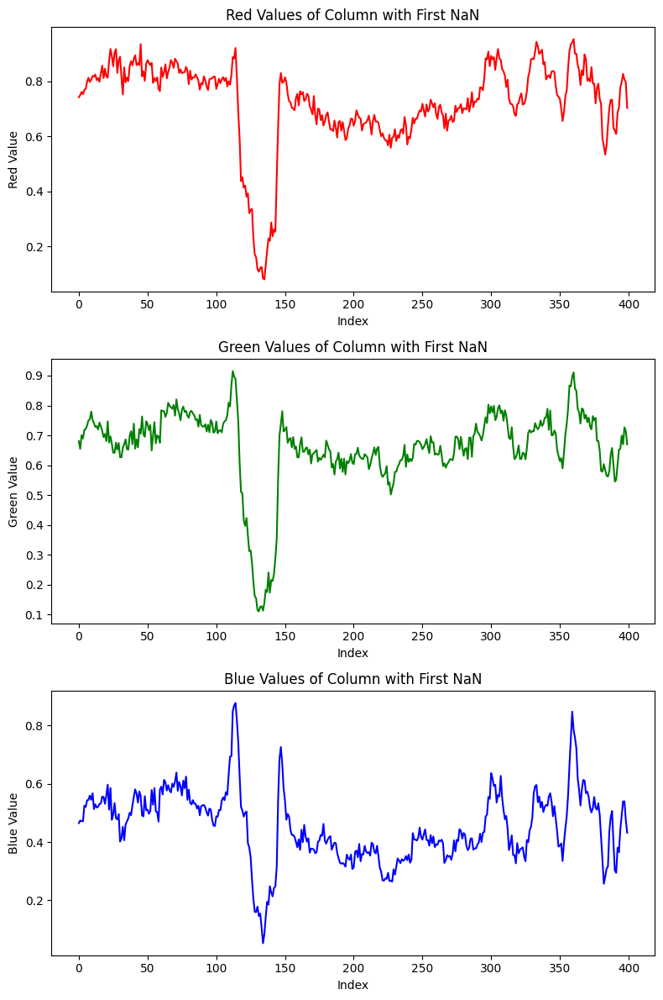

In [83]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = np.where(np.isnan(img_array_40))[1][0]

# Get the red values of the column
red_values = reshaped_A_np_40[:, column_index, 0]
# Get the green values of the column
green_values = reshaped_A_np_40[:, column_index, 1]
# Get the blue values of the column
blue_values = reshaped_A_np_40[:, column_index, 2]

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


## Peak Signal to noise ratio

In [84]:
crop = img_array_og_t/255
X_pred = reshaped_A
rmse6 = torch.sqrt(torch.mean(torch.mean(((crop - X_pred)**2), dim=(1,2))))
print(rmse6.item())

0.037116941064596176


In [85]:
psnr6 =20 * np.log10(1.0/rmse6.item())
print("PSNR6:", psnr6)

PSNR6: 28.608556453754858


# Unstruct 40X40


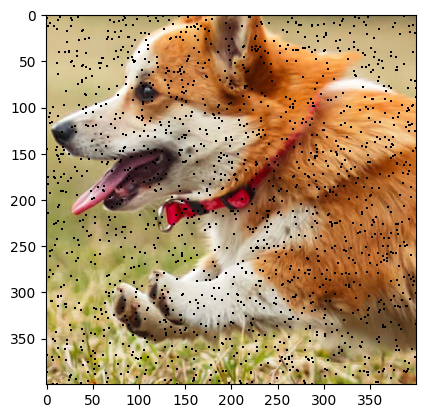

In [86]:
img_array_40_2 = img_array_og.copy().astype(float)
np.random.seed(42)
# Generate random indices for 900 points
random_indices = np.random.randint(0, img_array_40_2.shape[0], size=(1600, 2))

# Set the selected points to NaN
img_array_40_2[random_indices[:, 0], random_indices[:, 1], :] = np.nan

# Display the modified image
plt.imshow(img_array_40_2 / 255)
plt.show()


## Metric3 Unstruct patch

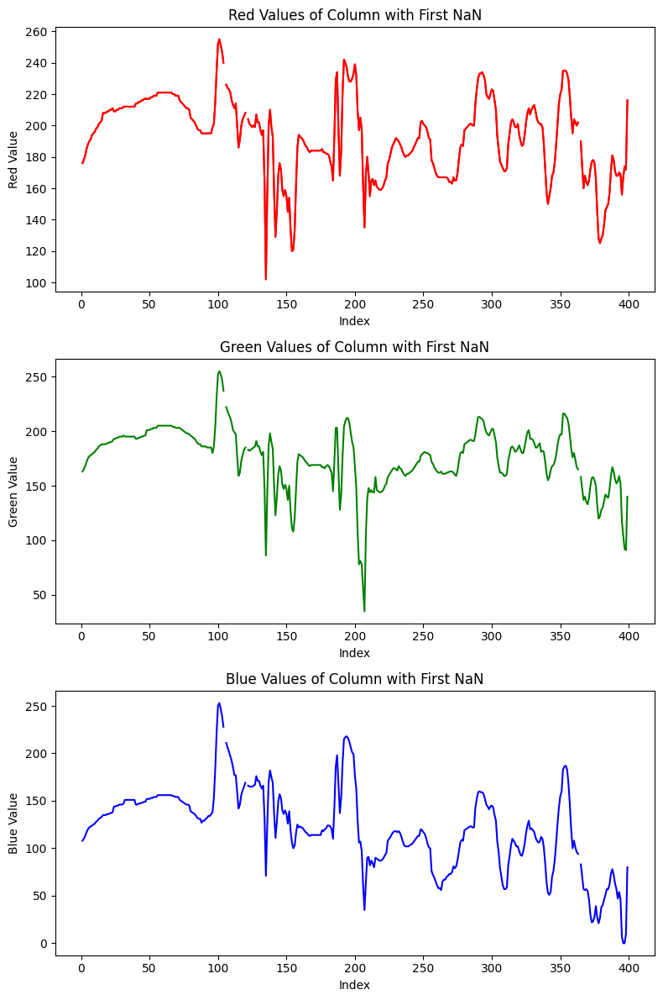

<Figure size 640x480 with 0 Axes>

In [87]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = torch.where(torch.isnan(torch.tensor(img_array_40_2)))[1][0]

# Get the red values of the column
red_values = torch.tensor(img_array_40_2[:, column_index, 0])
# Get the green values of the column
green_values = torch.tensor(img_array_40_2[:, column_index, 1])
# Get the blue values of the column
blue_values = torch.tensor(img_array_40_2[:, column_index, 2])

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')
# Plot the red values with missing values as black
axs[0].plot(red_values, color='red')
axs[0].scatter(torch.where(torch.isnan(red_values))[0], red_values[torch.isnan(red_values)], color='black')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values with missing values as black
axs[1].plot(green_values, color='green')
axs[1].scatter(torch.where(torch.isnan(green_values))[0], green_values[torch.isnan(green_values)], color='black')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values with missing values as black
axs[2].plot(blue_values, color='blue')
axs[2].scatter(torch.where(torch.isnan(blue_values))[0], blue_values[torch.isnan(blue_values)], color='black')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

## Reconst code unstruct

torch.Size([400, 400, 3])
[[[0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  ...
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]]

 ...

 [[0.61960784 0.51764706 0.3254902 ]
  [0.63529412 0.53333333 0.34117647]
  [0.63529412 0.5254902  0.32941176]
  ...
  [0.64313725 0.44313725 0.18823529]
  [0.64705882 0.43529412 0.2       ]
  [0.65490196 0.43137255 0.21568627]]

 [[0.61568627 0.53333333 0.30980392]
  [0.670588

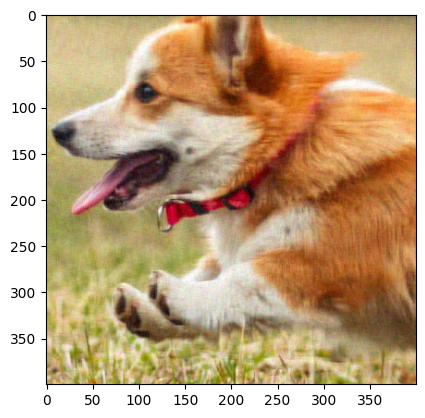

In [88]:
k=150
W = torch.randn(img_array_40_2.shape[0], k, 3, requires_grad=True, device=device)
H = torch.randn(k, img_array_40_2.shape[1], 3, requires_grad=True, device=device)
A = torch.randn(img_array_40_2.shape[0], img_array_40_2.shape[1], 3, requires_grad=True, device=device)
for i in range(3):
        W_n = W[:, :, i]
        H_n = H[:, :, i]
        A_n = (torch.from_numpy(img_array_20_2[:, :, i]).float())/255
        W_n, H_n, loss = factorize(A_n, k, device=device)
        temp_result = torch.mm(W_n, H_n)

          # Detach the tensor before assigning it to A
        A[:, :, i].data.copy_(temp_result.detach())


print(A.shape)

print(img_array_40_2/255)
# res = A.isnan().sum()
# # Printing the result
# print('Result: ', res)

print(A)
# # Display the reconstructed image
reshaped_A = A.view(int(img_array_40_2.shape[0]), img_array_40_2.shape[1], img_array_40_2.shape[2])
reshaped_A_np_40_2 = reshaped_A.detach().cpu().numpy()
plt.imshow(reshaped_A_np_40_2)
plt.show()



## Reconst unstruct metric3

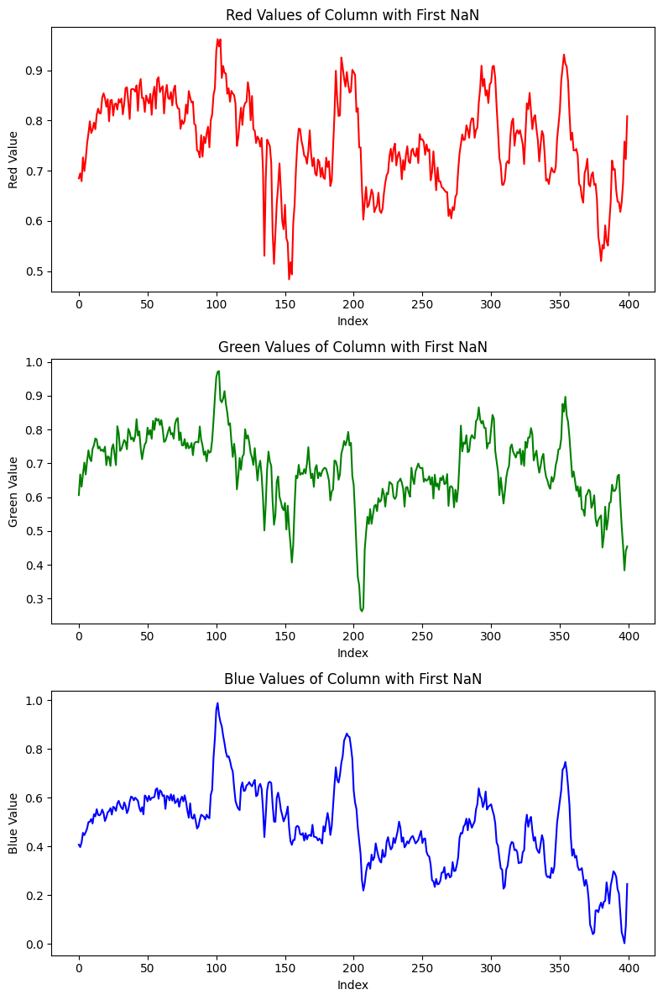

In [89]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = np.where(np.isnan(img_array_40_2))[1][0]

# Get the red values of the column
red_values = reshaped_A_np_40_2[:, column_index, 0]
# Get the green values of the column
green_values = reshaped_A_np_40_2[:, column_index, 1]
# Get the blue values of the column
blue_values = reshaped_A_np_40_2[:, column_index, 2]

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


## Peak Signal to noise ratio

In [90]:
crop = img_array_og_t/255
X_pred = reshaped_A
rmse7 = torch.sqrt(torch.mean(torch.mean(((crop - X_pred)**2), dim=(1,2))))
print(rmse7.item())

0.034021854400634766


In [91]:
psnr7 =20 * np.log10(1.0/rmse7.item())
print("PSNR7:", psnr7)

PSNR7: 29.364840367076823


# Struct patch 60X60

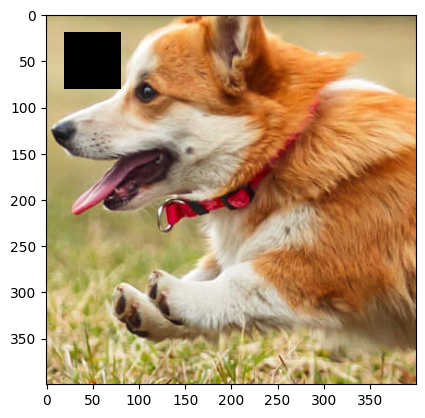

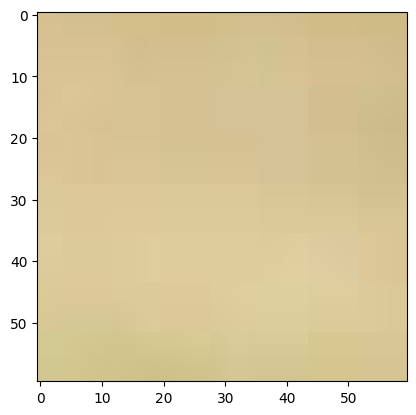

In [92]:
img_array_60 = img_array_og.copy()
img_array_60 = img_array_60.astype(float)
img_array_60[20:80, 20:80,:] = np.nan
plt.imshow(img_array_60/255)
plt.show()
plt.imshow(img_array_og[20:80, 20:80,:])
plt.show()


## Metrics3 Struct patch 60X60

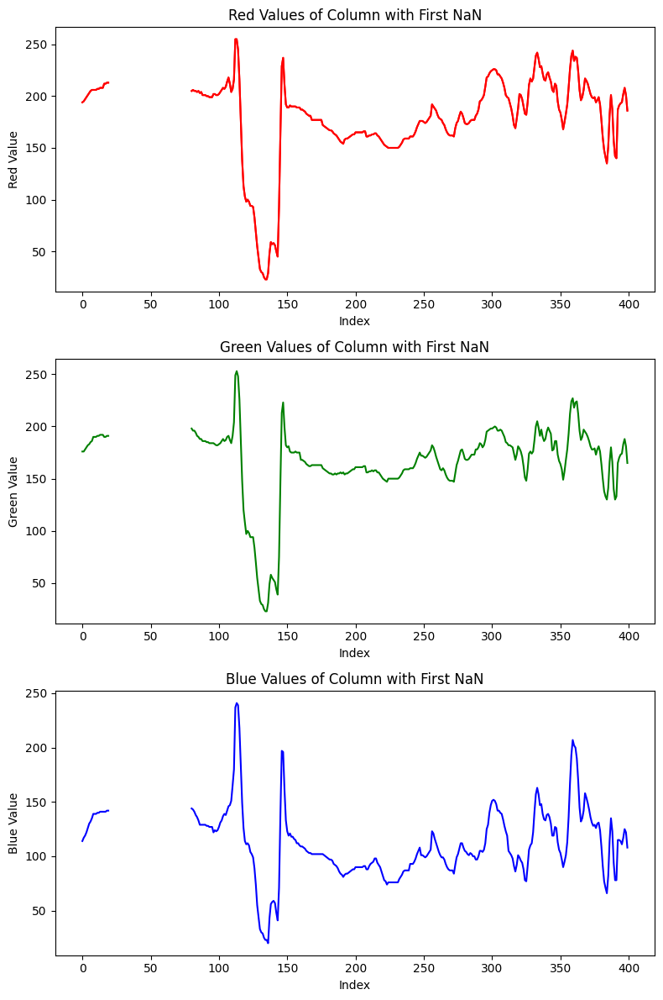

<Figure size 640x480 with 0 Axes>

In [93]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = torch.where(torch.isnan(torch.tensor(img_array_60)))[1][0]

# Get the red values of the column
red_values = torch.tensor(img_array_60[:, column_index, 0])
# Get the green values of the column
green_values = torch.tensor(img_array_60[:, column_index, 1])
# Get the blue values of the column
blue_values = torch.tensor(img_array_60[:, column_index, 2])

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')
# Plot the red values with missing values as black
axs[0].plot(red_values, color='red')
axs[0].scatter(torch.where(torch.isnan(red_values))[0], red_values[torch.isnan(red_values)], color='black')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values with missing values as black
axs[1].plot(green_values, color='green')
axs[1].scatter(torch.where(torch.isnan(green_values))[0], green_values[torch.isnan(green_values)], color='black')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values with missing values as black
axs[2].plot(blue_values, color='blue')
axs[2].scatter(torch.where(torch.isnan(blue_values))[0], blue_values[torch.isnan(blue_values)], color='black')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

## Reconstr 60X60 patch code

torch.Size([400, 400, 3])
[[[0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  ...
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]]

 ...

 [[0.61960784 0.51764706 0.3254902 ]
  [0.63529412 0.53333333 0.34117647]
  [0.63529412 0.5254902  0.32941176]
  ...
  [0.64313725 0.44313725 0.18823529]
  [0.64705882 0.43529412 0.2       ]
  [0.65490196 0.43137255 0.21568627]]

 [[0.61568627 0.53333333 0.30980392]
  [0.670588

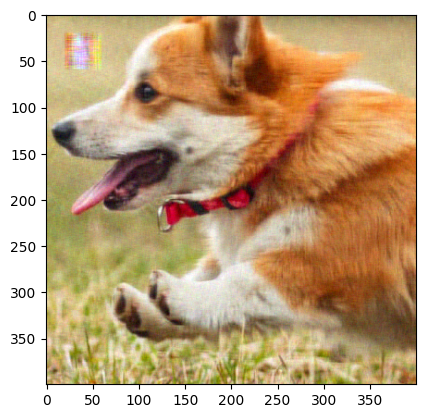

In [94]:
k=150
W = torch.randn(img_array_60.shape[0], k, 3, requires_grad=True, device=device)
H = torch.randn(k, img_array_60.shape[1], 3, requires_grad=True, device=device)
A = torch.randn(img_array_60.shape[0], img_array_60.shape[1], 3, requires_grad=True, device=device)
for i in range(3):
        W_n = W[:, :, i]
        H_n = H[:, :, i]
        A_n = (torch.from_numpy(img_array_40[:, :, i]).float())/255
        W_n, H_n, loss = factorize(A_n, k, device=device)
        temp_result = torch.mm(W_n, H_n)

          # Detach the tensor before assigning it to A
        A[:, :, i].data.copy_(temp_result.detach())


print(A.shape)

print(img_array_60/255)
# res = A.isnan().sum()
# # Printing the result
# print('Result: ', res)

print(A)
# # Display the reconstructed image
reshaped_A = A.view(int(img_array_60.shape[0]), img_array_60.shape[1], img_array_60.shape[2])
reshaped_A_np_60 = reshaped_A.detach().cpu().numpy()
plt.imshow(reshaped_A_np_60)
plt.show()



## Metrics3 reconstructed 60X60

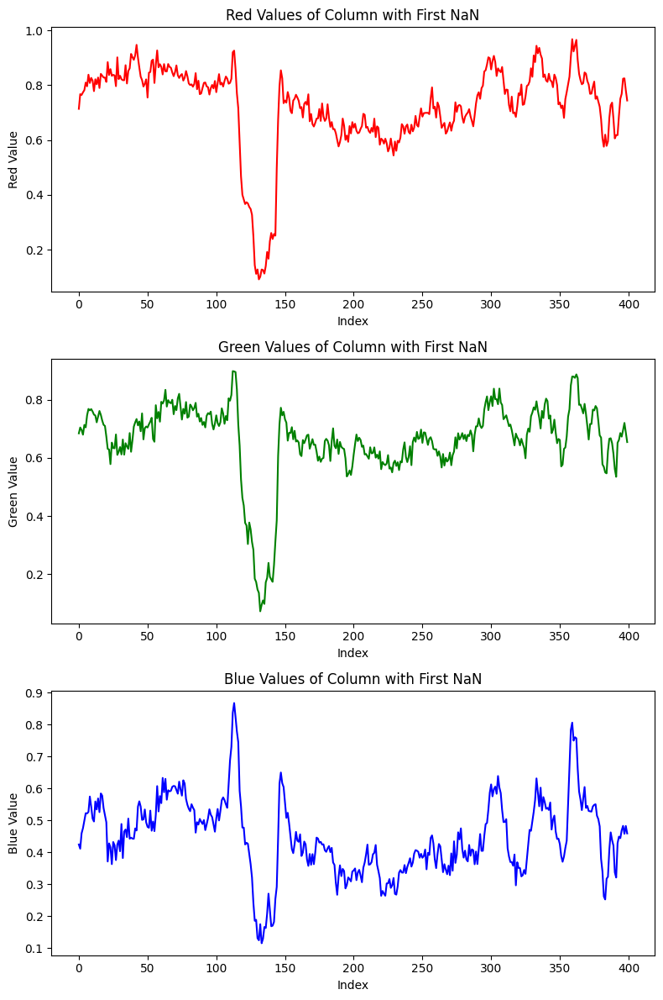

In [95]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = np.where(np.isnan(img_array_60))[1][0]

# Get the red values of the column
red_values = reshaped_A_np_60[:, column_index, 0]
# Get the green values of the column
green_values = reshaped_A_np_60[:, column_index, 1]
# Get the blue values of the column
blue_values = reshaped_A_np_60[:, column_index, 2]

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


## Peak signal to noise ratio

In [97]:
crop = img_array_og_t/255
X_pred = reshaped_A
rmse8 = torch.sqrt(torch.mean(torch.mean(((crop - X_pred)**2), dim=(1,2))))
print(rmse8.item())

0.03700999543070793


In [98]:
psnr8 =20 * np.log10(1.0/rmse8.item())
print("PSNR8:", psnr8)

PSNR8: 28.633619370466562


# Unstruct 60X60 patch

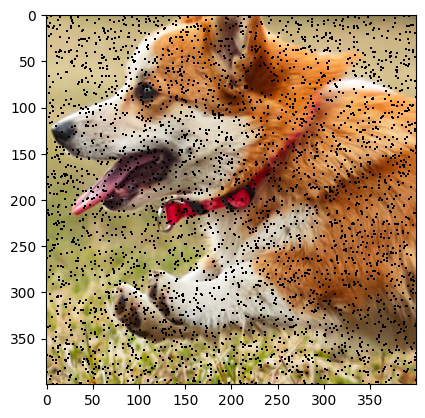

In [99]:
img_array_60_2 = img_array_og.copy().astype(float)
np.random.seed(42)
# Generate random indices for 3600 points
random_indices = np.random.randint(0, img_array_60_2.shape[0], size=(3600, 2))

# Set the selected points to NaN
img_array_60_2[random_indices[:, 0], random_indices[:, 1], :] = np.nan

# Display the modified image
plt.imshow(img_array_60_2 / 255)
plt.show()


## Metric3 unstruct patch 60X60

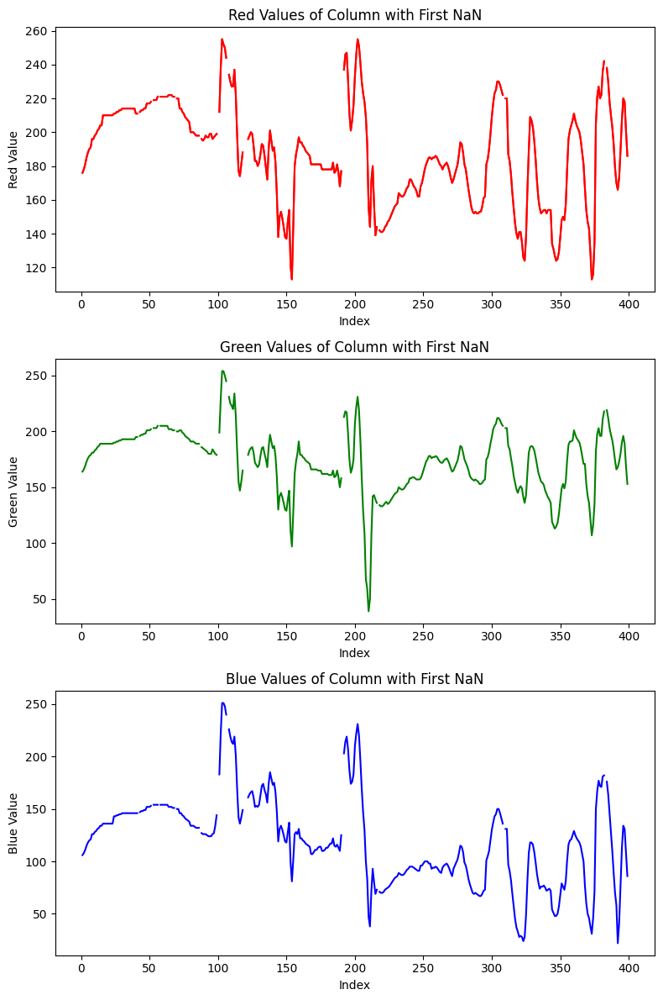

<Figure size 640x480 with 0 Axes>

In [100]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = torch.where(torch.isnan(torch.tensor(img_array_60_2)))[1][0]

# Get the red values of the column
red_values = torch.tensor(img_array_60_2[:, column_index, 0])
# Get the green values of the column
green_values = torch.tensor(img_array_60_2[:, column_index, 1])
# Get the blue values of the column
blue_values = torch.tensor(img_array_60_2[:, column_index, 2])

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')
# Plot the red values with missing values as black
axs[0].plot(red_values, color='red')
axs[0].scatter(torch.where(torch.isnan(red_values))[0], red_values[torch.isnan(red_values)], color='black')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values with missing values as black
axs[1].plot(green_values, color='green')
axs[1].scatter(torch.where(torch.isnan(green_values))[0], green_values[torch.isnan(green_values)], color='black')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values with missing values as black
axs[2].plot(blue_values, color='blue')
axs[2].scatter(torch.where(torch.isnan(blue_values))[0], blue_values[torch.isnan(blue_values)], color='black')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

## Reconstr unstruct 60X60

torch.Size([400, 400, 3])
[[[0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  ...
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]]

 ...

 [[0.61960784 0.51764706 0.3254902 ]
  [0.63529412 0.53333333 0.34117647]
  [0.63529412 0.5254902  0.32941176]
  ...
  [0.64313725 0.44313725 0.18823529]
  [0.64705882 0.43529412 0.2       ]
  [0.65490196 0.43137255 0.21568627]]

 [[0.61568627 0.53333333 0.30980392]
  [0.670588

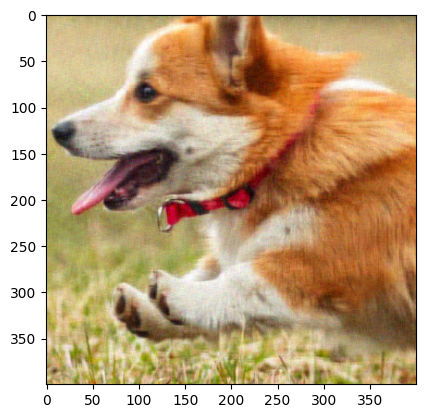

In [101]:
k=150
W = torch.randn(img_array_60_2.shape[0], k, 3, requires_grad=True, device=device)
H = torch.randn(k, img_array_60_2.shape[1], 3, requires_grad=True, device=device)
A = torch.randn(img_array_60_2.shape[0], img_array_60_2.shape[1], 3, requires_grad=True, device=device)
for i in range(3):
        W_n = W[:, :, i]
        H_n = H[:, :, i]
        A_n = (torch.from_numpy(img_array_60_2[:, :, i]).float())/255
        W_n, H_n, loss = factorize(A_n, k, device=device)
        temp_result = torch.mm(W_n, H_n)

          # Detach the tensor before assigning it to A
        A[:, :, i].data.copy_(temp_result.detach())


print(A.shape)

print(img_array_60_2/255)
# res = A.isnan().sum()
# # Printing the result
# print('Result: ', res)

print(A)
# # Display the reconstructed image
reshaped_A = A.view(int(img_array_60_2.shape[0]), img_array_60_2.shape[1], img_array_60_2.shape[2])
reshaped_A_np_60_2 = reshaped_A.detach().cpu().numpy()
plt.imshow(reshaped_A_np_60_2)
plt.show()


## Unstruct metric3 reconstr 60X60

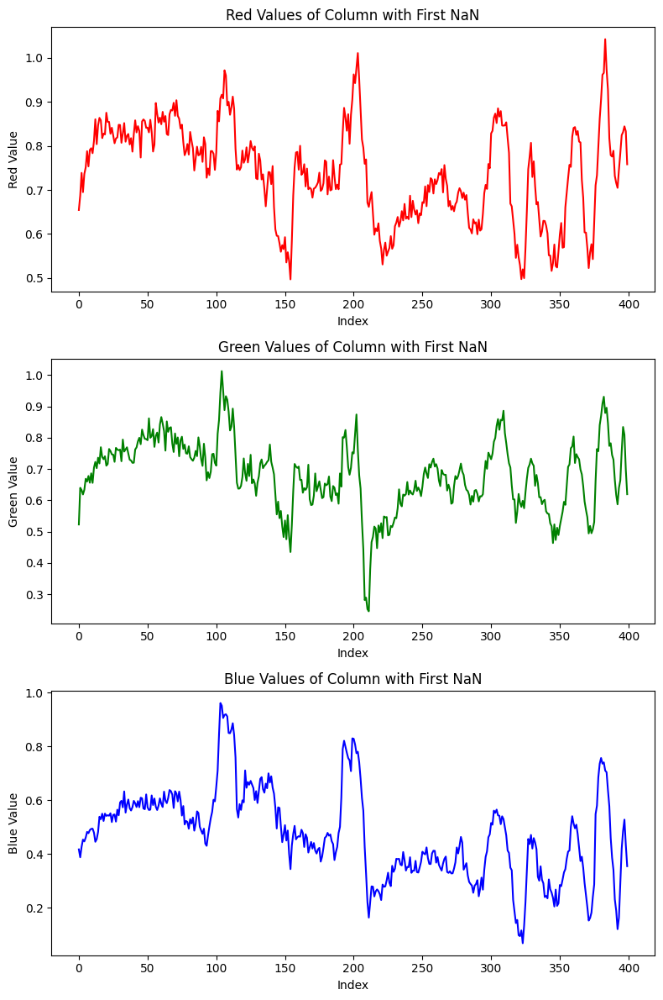

In [102]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = np.where(np.isnan(img_array_60_2))[1][0]

# Get the red values of the column
red_values = reshaped_A_np_60_2[:, column_index, 0]
# Get the green values of the column
green_values = reshaped_A_np_60_2[:, column_index, 1]
# Get the blue values of the column
blue_values = reshaped_A_np_60_2[:, column_index, 2]

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


## Peak signal to noise ratio

In [103]:
crop = img_array_og_t/255
X_pred = reshaped_A
rmse9 = torch.sqrt(torch.mean(torch.mean(((crop - X_pred)**2), dim=(1,2))))
print(rmse9.item())

0.03446115925908089


In [104]:
psnr9 =20 * np.log10(1.0/rmse9.item())
print("PSNR9:", psnr9)

PSNR9: 29.253402343126176


# struct patch 80X80

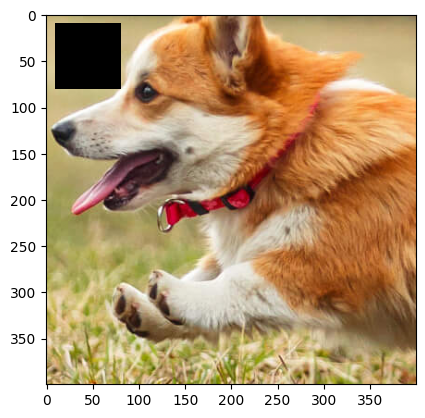

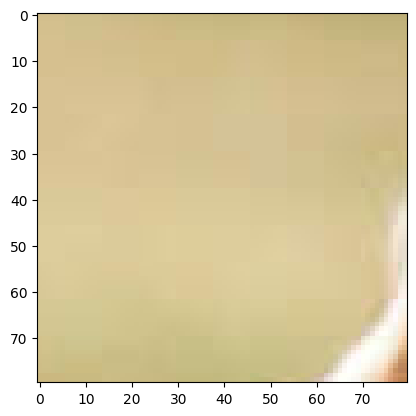

In [105]:
img_array_80 = img_array_og.copy()
img_array_80 = img_array_80.astype(float)
img_array_80[10:80, 10:80,:] = np.nan
plt.imshow(img_array_80/255)
plt.show()
plt.imshow(img_array_og[10:90, 10:90,:])
plt.show()


## struct patch 80X80 metric3

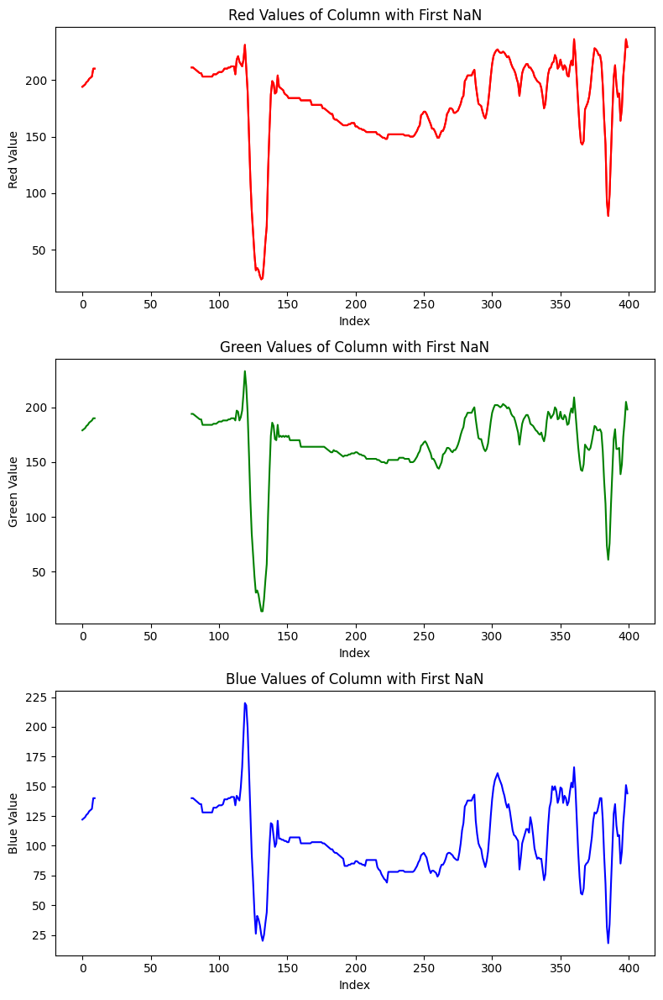

<Figure size 640x480 with 0 Axes>

In [106]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = torch.where(torch.isnan(torch.tensor(img_array_80)))[1][0]

# Get the red values of the column
red_values = torch.tensor(img_array_80[:, column_index, 0])
# Get the green values of the column
green_values = torch.tensor(img_array_80[:, column_index, 1])
# Get the blue values of the column
blue_values = torch.tensor(img_array_80[:, column_index, 2])

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')
# Plot the red values with missing values as black
axs[0].plot(red_values, color='red')
axs[0].scatter(torch.where(torch.isnan(red_values))[0], red_values[torch.isnan(red_values)], color='black')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values with missing values as black
axs[1].plot(green_values, color='green')
axs[1].scatter(torch.where(torch.isnan(green_values))[0], green_values[torch.isnan(green_values)], color='black')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values with missing values as black
axs[2].plot(blue_values, color='blue')
axs[2].scatter(torch.where(torch.isnan(blue_values))[0], blue_values[torch.isnan(blue_values)], color='black')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

## Reconstr struct 80X80

torch.Size([400, 400, 3])
[[[0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  ...
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]]

 ...

 [[0.61960784 0.51764706 0.3254902 ]
  [0.63529412 0.53333333 0.34117647]
  [0.63529412 0.5254902  0.32941176]
  ...
  [0.64313725 0.44313725 0.18823529]
  [0.64705882 0.43529412 0.2       ]
  [0.65490196 0.43137255 0.21568627]]

 [[0.61568627 0.53333333 0.30980392]
  [0.670588

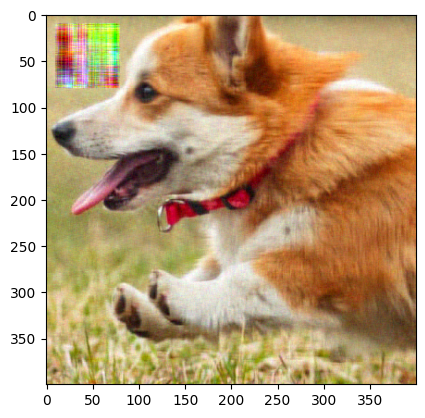

In [107]:
k=150
W = torch.randn(img_array_80.shape[0], k, 3, requires_grad=True, device=device)
H = torch.randn(k, img_array_80.shape[1], 3, requires_grad=True, device=device)
A = torch.randn(img_array_80.shape[0], img_array_80.shape[1], 3, requires_grad=True, device=device)
for i in range(3):
        W_n = W[:, :, i]
        H_n = H[:, :, i]
        A_n = (torch.from_numpy(img_array_80[:, :, i]).float())/255
        W_n, H_n, loss = factorize(A_n, k, device=device)
        temp_result = torch.mm(W_n, H_n)

          # Detach the tensor before assigning it to A
        A[:, :, i].data.copy_(temp_result.detach())


print(A.shape)

print(img_array_80/255)
# res = A.isnan().sum()
# # Printing the result
# print('Result: ', res)

print(A)
# # Display the reconstructed image
reshaped_A = A.view(int(img_array_80.shape[0]), img_array_80.shape[1], img_array_60.shape[2])
reshaped_A_np_80 = reshaped_A.detach().cpu().numpy()
plt.imshow(reshaped_A_np_80)
plt.show()



## Struct Metric3 reconst 80X80

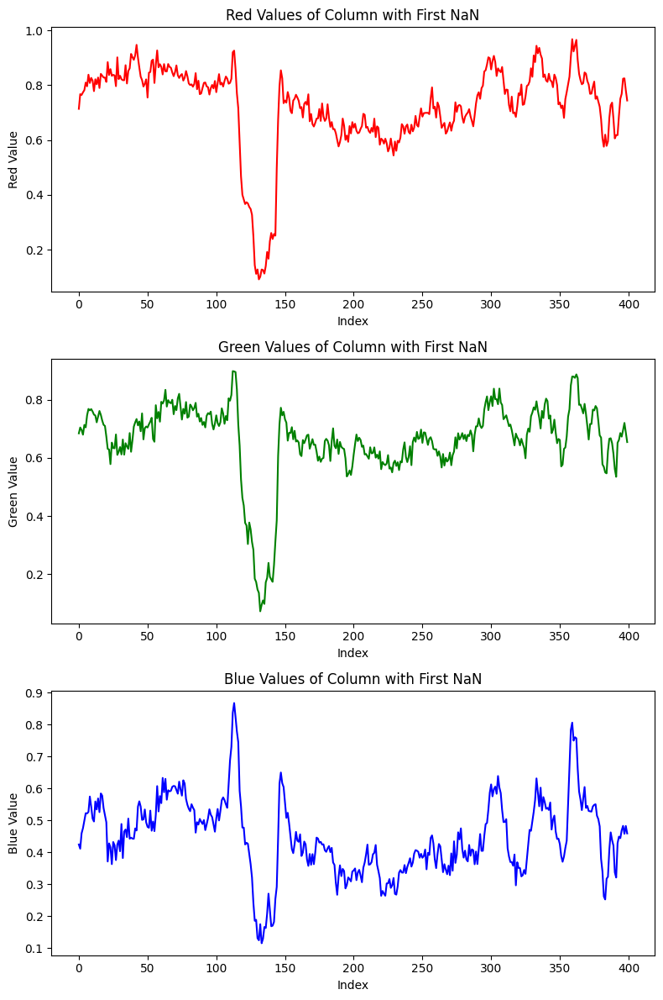

In [108]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = np.where(np.isnan(img_array_60))[1][0]

# Get the red values of the column
red_values = reshaped_A_np_60[:, column_index, 0]
# Get the green values of the column
green_values = reshaped_A_np_60[:, column_index, 1]
# Get the blue values of the column
blue_values = reshaped_A_np_60[:, column_index, 2]

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


## Peak signal to noise ratio


In [109]:
crop = img_array_og_t/255
X_pred = reshaped_A
rmse10 = torch.sqrt(torch.mean(torch.mean(((crop - X_pred)**2), dim=(1,2))))
print(rmse10.item())

0.05742042511701584


In [110]:
psnr10 =20 * np.log10(1.0/rmse10.item())
print("PSNR10:", psnr10)

PSNR10: 24.818671929827282


# Unstruct 80X80 patch

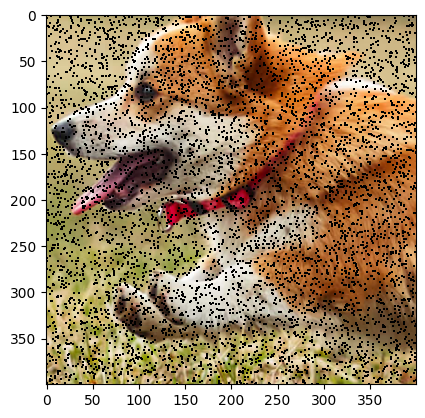

In [111]:
img_array_80_2 = img_array_og.copy().astype(float)
np.random.seed(42)
# Generate random indices for 3600 points
random_indices = np.random.randint(0, img_array_80_2.shape[0], size=(6400, 2))

# Set the selected points to NaN
img_array_80_2[random_indices[:, 0], random_indices[:, 1], :] = np.nan

# Display the modified image
plt.imshow(img_array_80_2 / 255)
plt.show()


## Metrics3 Unstruct patch 80X80

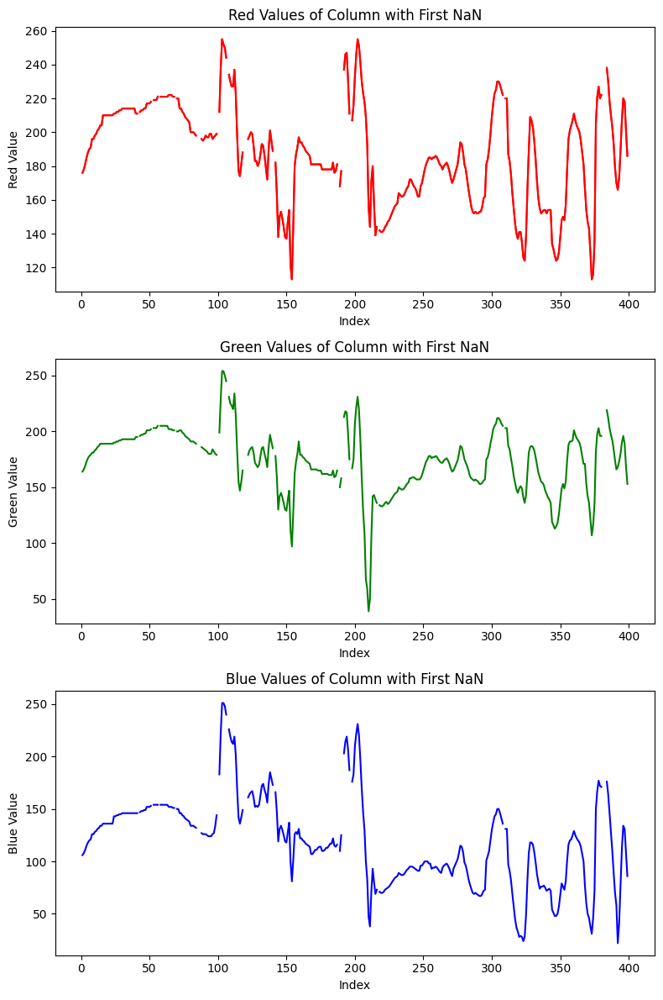

<Figure size 640x480 with 0 Axes>

In [112]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = torch.where(torch.isnan(torch.tensor(img_array_80_2)))[1][0]

# Get the red values of the column
red_values = torch.tensor(img_array_80_2[:, column_index, 0])
# Get the green values of the column
green_values = torch.tensor(img_array_80_2[:, column_index, 1])
# Get the blue values of the column
blue_values = torch.tensor(img_array_80_2[:, column_index, 2])

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')
# Plot the red values with missing values as black
axs[0].plot(red_values, color='red')
axs[0].scatter(torch.where(torch.isnan(red_values))[0], red_values[torch.isnan(red_values)], color='black')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values with missing values as black
axs[1].plot(green_values, color='green')
axs[1].scatter(torch.where(torch.isnan(green_values))[0], green_values[torch.isnan(green_values)], color='black')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values with missing values as black
axs[2].plot(blue_values, color='blue')
axs[2].scatter(torch.where(torch.isnan(blue_values))[0], blue_values[torch.isnan(blue_values)], color='black')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

## Reconstr unstruct 80X80

torch.Size([400, 400, 3])
[[[0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  [0.76862745 0.69411765 0.4745098 ]
  ...
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  [0.77254902 0.69803922 0.47843137]
  ...
  [       nan        nan        nan]
  [0.56078431 0.47058824 0.3372549 ]
  [0.56078431 0.47058824 0.3372549 ]]

 [[0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  [0.77647059 0.70196078 0.48235294]
  ...
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]
  [0.55686275 0.47843137 0.34117647]]

 ...

 [[0.61960784 0.51764706 0.3254902 ]
  [0.63529412 0.53333333 0.34117647]
  [0.63529412 0.5254902  0.32941176]
  ...
  [0.64313725 0.44313725 0.18823529]
  [0.64705882 0.43529412 0.2       ]
  [0.65490196 0.43137255 0.21568627]]

 [[0.61568627 0.53333333 0.30980392]
  [       n

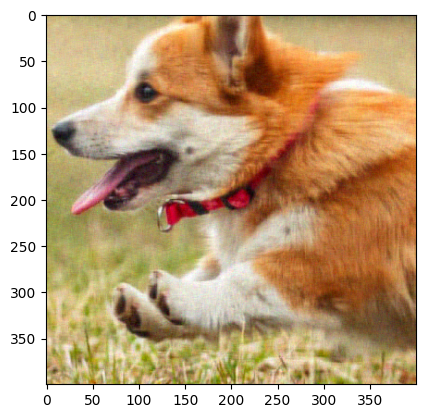

In [113]:
k=150
W = torch.randn(img_array_80_2.shape[0], k, 3, requires_grad=True, device=device)
H = torch.randn(k, img_array_80_2.shape[1], 3, requires_grad=True, device=device)
A = torch.randn(img_array_80_2.shape[0], img_array_80_2.shape[1], 3, requires_grad=True, device=device)
for i in range(3):
        W_n = W[:, :, i]
        H_n = H[:, :, i]
        A_n = (torch.from_numpy(img_array_80_2[:, :, i]).float())/255
        W_n, H_n, loss = factorize(A_n, k, device=device)
        temp_result = torch.mm(W_n, H_n)

          # Detach the tensor before assigning it to A
        A[:, :, i].data.copy_(temp_result.detach())


print(A.shape)

print(img_array_80_2/255)
# res = A.isnan().sum()
# # Printing the result
# print('Result: ', res)

print(A)
# # Display the reconstructed image
reshaped_A = A.view(int(img_array_80_2.shape[0]), img_array_80_2.shape[1], img_array_80_2.shape[2])
reshaped_A_np_80_2 = reshaped_A.detach().cpu().numpy()
plt.imshow(reshaped_A_np_80_2)
plt.show()


## Unstruct metric3 reconstr 80X80

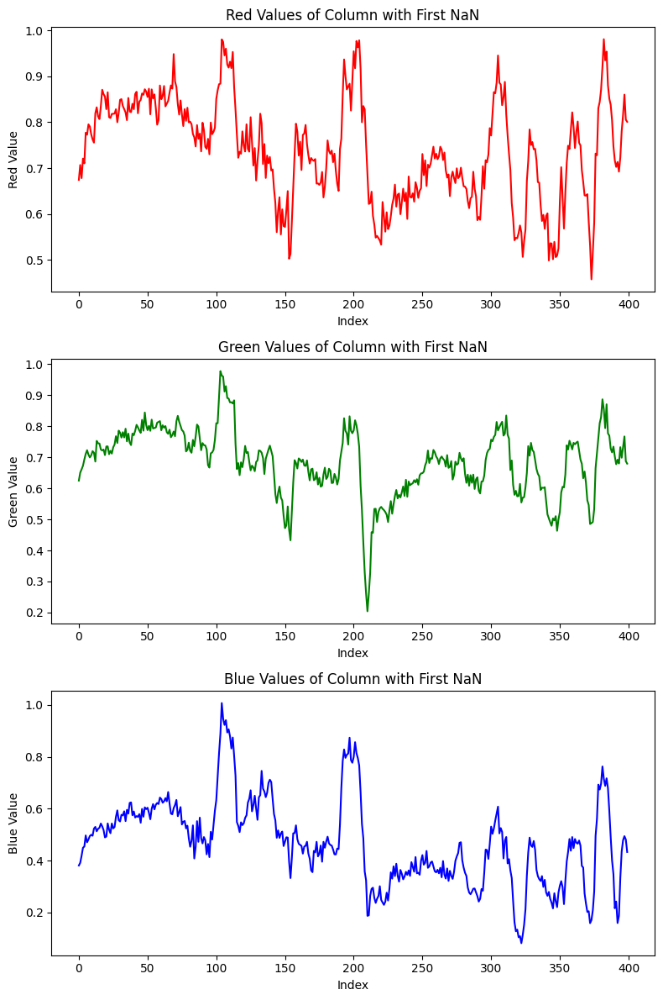

In [114]:
import matplotlib.pyplot as plt

# Find the column index where the first NaN value occurs
column_index = np.where(np.isnan(img_array_80_2))[1][0]

# Get the red values of the column
red_values = reshaped_A_np_80_2[:, column_index, 0]
# Get the green values of the column
green_values = reshaped_A_np_80_2[:, column_index, 1]
# Get the blue values of the column
blue_values = reshaped_A_np_80_2[:, column_index, 2]

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot the red values
axs[0].plot(red_values, color='red')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Red Value')
axs[0].set_title('Red Values of Column with First NaN')

# Plot the green values
axs[1].plot(green_values, color='green')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Green Value')
axs[1].set_title('Green Values of Column with First NaN')

# Plot the blue values
axs[2].plot(blue_values, color='blue')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Blue Value')
axs[2].set_title('Blue Values of Column with First NaN')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


## Peak Signal to noise ratio

In [115]:
crop = img_array_og_t/255
X_pred = reshaped_A
rmse11 = torch.sqrt(torch.mean(torch.mean(((crop - X_pred)**2), dim=(1,2))))
print(rmse11.item())

0.034982096403837204


In [116]:
psnr11 =20 * np.log10(1.0/rmse11.item())
print("PSNR11:", psnr11)

PSNR11: 29.123083354358442


In [117]:
rmse1

tensor(0.0104, device='cuda:0', grad_fn=<SqrtBackward0>)

In [118]:
rmse1_cpu = rmse1.detach().cpu().numpy()
rmse2_cpu = rmse2.detach().cpu().numpy()
rmse3_cpu = rmse3.detach().cpu().numpy()
rmse4_cpu = rmse4.detach().cpu().numpy()
rmse5_cpu = rmse5.detach().cpu().numpy()
rmse6_cpu = rmse6.detach().cpu().numpy()
rmse7_cpu = rmse7.detach().cpu().numpy()
rmse8_cpu = rmse7.detach().cpu().numpy()
rmse9_cpu = rmse7.detach().cpu().numpy()
rmse10_cpu = rmse7.detach().cpu().numpy()
rmse11_cpu = rmse7.detach().cpu().numpy()



# Comparison bw RMSE, PSNR values

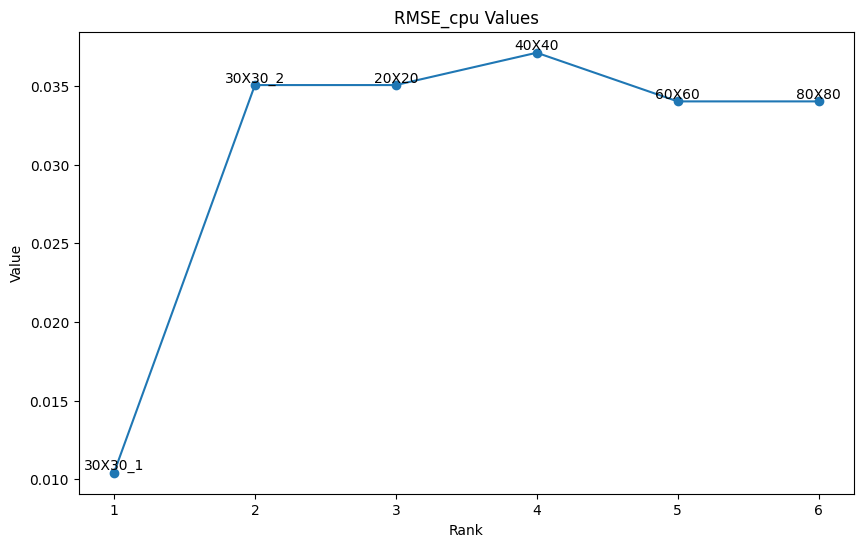

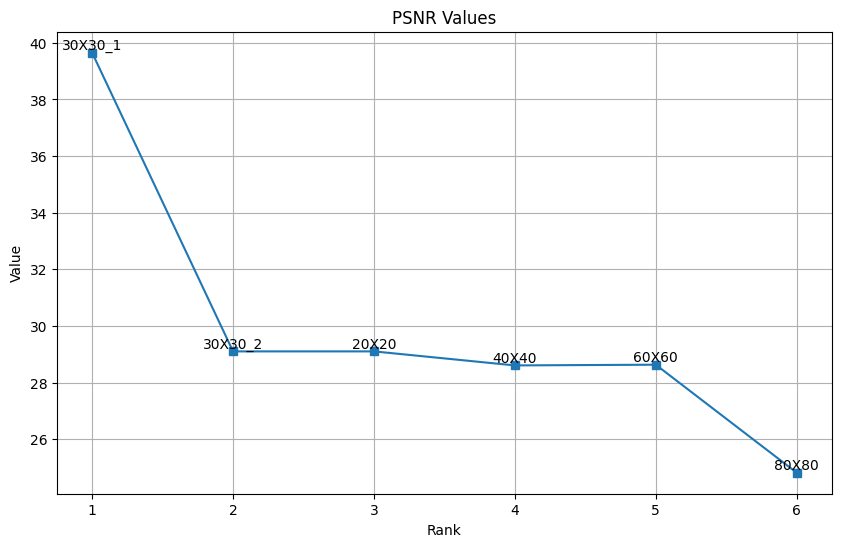

In [119]:

rmse_cpu = [rmse1_cpu, rmse2_cpu,  rmse4_cpu, rmse6_cpu, rmse8_cpu, rmse10_cpu]
psnr = [psnr1, psnr2, psnr4,  psnr6, psnr8, psnr10]
plt.figure(figsize=(10, 6))

# Plot RMSE_cpu values
plt.plot(range(1, 7), rmse_cpu, marker='o', label='RMSE_cpu')
for i, (x, y, label) in enumerate(zip(range(1, 7), rmse_cpu, ['30X30_1', '30X30_2','20X20', '40X40', '60X60', '80X80'])):
    plt.text(x, y, f'{label}', ha='center', va='bottom')
plt.xlabel('Rank')
plt.ylabel('Value')
plt.title('RMSE_cpu Values')
plt.show()
# Plot PSNR values
plt.figure(figsize=(10, 6))
plt.plot(range(1, 7), psnr, marker='s', label='PSNR')
for i, (x, y, label) in enumerate(zip(range(1, 7), psnr, ['30X30_1', '30X30_2','20X20', '40X40', '60X60', '80X80'])):
    plt.text(x, y, f'{label}', ha='center', va='bottom')
# Set labels and title
plt.xlabel('Rank')
plt.ylabel('Value')
plt.title('PSNR Values')

# Show the plot
plt.grid(True)
plt.show()

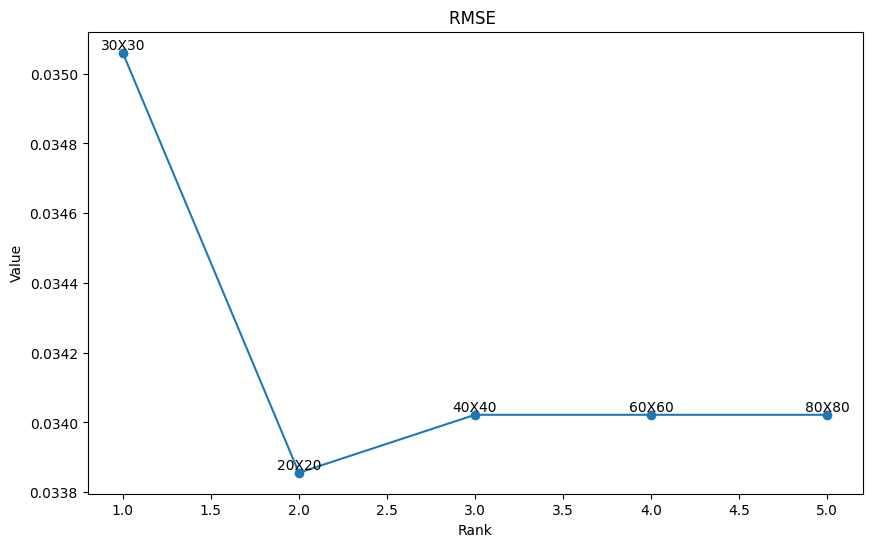

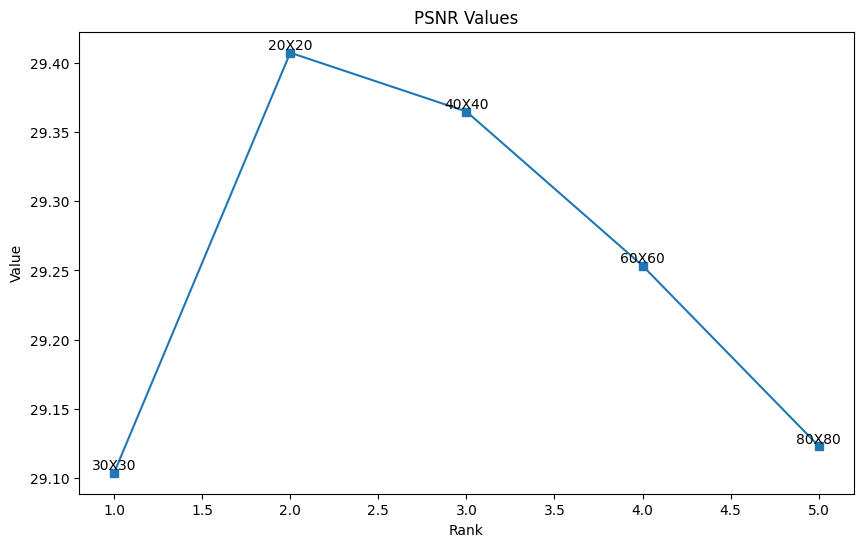

In [120]:

rmse = [rmse3_cpu, rmse5_cpu,  rmse7_cpu, rmse9_cpu, rmse11_cpu]
psnr = [psnr3, psnr5, psnr7,  psnr9, psnr11]
plt.figure(figsize=(10, 6))
# Plot RMSE values
plt.plot(range(1, 6), rmse, marker='o', label='RMSE')
for i, (x, y, label) in enumerate(zip(range(1, 6), rmse, ['30X30', '20X20', '40X40', '60X60', '80X80'])):
    plt.text(x, y, f'{label}', ha='center', va='bottom')
plt.xlabel('Rank')
plt.ylabel('Value')
plt.title('RMSE ')
plt.show()
plt.figure(figsize=(10, 6))
# Plot PSNR values
plt.plot(range(1, 6), psnr, marker='s', label='PSNR')
for i, (x, y, label) in enumerate(zip(range(1, 6), psnr, ['30X30', '20X20', '40X40', '60X60', '80X80'])):
    plt.text(x, y, f'{label}', ha='center', va='bottom')
# Set labels and title
plt.xlabel('Rank')
plt.ylabel('Value')
plt.title('PSNR Values')
plt.show()
# Add legend


